# Master Thesis DSS
## Thesis topic: Forecasting Green Bond Issuance

Nhi Tran 2077737 – Msc DSS Tilburg University
Supervisor - Dr. Gonzalo Nápoles 

# 1. EDA 

## 1.1  Loading packages and dataset(s)

The dataset is retrieved from Refinitiv Eikon Asset/4 a so 09/10/2022 via the App Government and Corporate Bonds with the following criteria's 
* Asset Class: Corporate
* Instrument Type: Bond
* Asset Status: Active and Issued

The dataset is loaded with pandas. EDA is performed using pandas, matplotlib and seaborn.

In [24]:
import os
from IPython.display import display
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams
import time
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, KFold, cross_val_score
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import xgboost as xgb
import optuna.integration.lightgbm as lgb
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer
from scipy.spatial.distance import mahalanobis
import optuna.integration.lightgbm as lgb
import optuna
import pingouin as pg

In [25]:
pd.set_option('display.max_colwidth', None)

In [26]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [104]:
%matplotlib inline
rcParams['figure.figsize'] = 10, 10
plt.rcParams.update({'font.size': 16})
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.style.use('seaborn-whitegrid')

In [28]:
path = "C:/Users/nhiii/OneDrive/Studying/Data Science/M DSS Feb 2022/Thesis/Preprocessed dataset/DataF8.csv"
df = pd.read_csv(path)

## 1.2 Preliminary analysis

Check shape, data types, data values 

* Original dataset with 469 instances with total of 14 columns. 
* Chose only 12 variables (incl. 1 target) and include all 469 instances for the model .
* Target variable is continuous variable 'Amount Issued (EUR)'
* Predictors include both cat and cont variables, which can be grouped as followed:
  * Firm's specifics: ESG scores (E. score, S. score and G. score) , Profitability (ROE as a proxy measure)and Solvency (use WACC ratio as a proxy measure)
  * Market features: Market of Issue, Country of Issue, Sector (implying market characteristics shared in common)
  * Bond's specifics: Use of Proceeds, Principal Currency and Coupon (rate)

In [29]:
print("This dataset has {} entries and {} features".format(*df.shape))

This dataset has 460 entries and 22 features


In [30]:
df.head()

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,Country of Issue,Sector,Use of Proceeds,Principal Currency,Maturity,Issue Date,Coupon,Amount Issued (USD),Preferred RIC,Issuer
0,TH0221032B04,4295892710,73.40,59.11,96.42,55.23,2.20,7.95,0.60,0.06,...,Thailand,Transportation,Clean Transport,Thai Baht,06/11/2022,06/11/2020,2.10,1.413257e+07,BTSG22NA=TS,BTS Group Holdings PCL
1,FR0013048204,4295867555,89.06,92.93,90.27,83.41,3.00,6.38,0.34,0.04,...,France,Real Estate,Eligible Green Projects,Euro,06/11/2022,06/11/2015,2.75,4.923504e+07,FR0013048204=,Gecina SA
2,NZCEND0040L1,4295885081,54.09,51.01,50.70,63.71,4.89,6.74,0.21,0.05,...,New Zealand,Utility,Energy Efficiency,New Zealand Dollar,15/11/2022,23/02/2017,4.63,5.937995e+07,NZCEN1122=,Contact Energy Ltd
3,JP373480AKB4,4295876533,64.28,86.11,56.46,48.35,6.97,11.13,0.22,0.00,...,Japan,Electronics,Eligible Green Projects,Japanese Yen,28/11/2022,28/11/2019,0.02,3.410176e+08,JP00096594=,Nidec Corp
4,SE0013882743,4295889919,59.00,55.53,67.04,53.51,-0.30,2.38,0.42,0.05,...,Sweden,Home Builders,Clean Transport,Swedish Krona,30/11/2022,30/11/2020,1.97,3.231286e+07,SE0013882743=,Wallenstam AB


In [31]:
df.tail()

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,Country of Issue,Sector,Use of Proceeds,Principal Currency,Maturity,Issue Date,Coupon,Amount Issued (USD),Preferred RIC,Issuer
455,JP356680AN38,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,Japan,Railroads,Clean Transport,Japanese Yen,09/03/2057,09/03/2022,1.09,136407038.0,JP00859022=,Central Japan Railway Co
456,JP356680AN53,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,Japan,Railroads,Clean Transport,Japanese Yen,25/05/2057,17/05/2022,1.24,68203519.0,JP00869022=,Central Japan Railway Co
457,JP358260BK34,4295878581,56.51,82.86,54.39,33.38,3.36,10.59,0.58,0.01,...,Japan,Service,Energy Efficiency,Japanese Yen,15/03/2059,15/03/2019,2.15,341017596.0,JP02018804=,Tokyo Tatemono Co Ltd
458,FR0014003GT5,8589934326,94.61,94.13,95.92,93.01,0.41,6.70,0.06,0.03,...,France,Banking,Energy Efficiency,Euro,11/05/2026,11/05/2021,0.17,6804480.0,FR0014003GT5,BNP Paribas SA
459,TW000B609072,4295892129,72.75,65.47,90.50,52.19,21.33,21.34,0.11,0.06,...,Taiwan,Electronics,Pollution Control,Taiwanese Dollar,06/10/2026,06/10/2021,0.52,21806853.0,TW000B609072,Vanguard International Semiconductor Corp


In [32]:
df.columns

Index(['ISIN', 'PARENT ID', 'ESG Score', 'Environmental Pillar Score',
       'Social Pillar Score', 'Governance Pillar Score', 'Return On Asset',
       'Return On Equity', 'Total Debt to Asset', 'WACC Cost of Debt',
       'Issuer Credit Rating', 'Market of Issue', 'Country of Issue', 'Sector',
       'Use of Proceeds', 'Principal Currency', 'Maturity', 'Issue Date',
       'Coupon', 'Amount Issued (USD)', 'Preferred RIC', 'Issuer'],
      dtype='object')

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ISIN                        460 non-null    object 
 1   PARENT ID                   460 non-null    int64  
 2   ESG Score                   460 non-null    float64
 3   Environmental Pillar Score  460 non-null    float64
 4   Social Pillar Score         460 non-null    float64
 5   Governance Pillar Score     460 non-null    float64
 6   Return On Asset             460 non-null    float64
 7   Return On Equity            460 non-null    float64
 8   Total Debt to Asset         460 non-null    float64
 9   WACC Cost of Debt           460 non-null    float64
 10  Issuer Credit Rating        460 non-null    object 
 11  Market of Issue             460 non-null    object 
 12  Country of Issue            460 non-null    object 
 13  Sector                      460 non

In [34]:
df.nunique(axis = 0) # ISIN is unique identifier hence same no. of unique values as a no. of records in the dataset 
# IMM Parent Perm ID: parent company identifier in Asset4
# ESG Score: Overall ESG score collected by rating agency via firm's publish site or user's contribution
# Environmental Pillar Score, Social Pillar Score and Governance Score are component score derived from?
# ROE: representing firm's profitablity (commonly used ration - %) 
# Solvency ratio: representing firm's solvency (commonly used ration - %) 
# Issuer Credit Rating: representing third party's rating of firm's overall credit rating
# Market of Issue: 
# Country of Issue:
# Sector: 
# Use of proceeds:
# Principal currency: 

ISIN                          460
PARENT ID                     201
ESG Score                     203
Environmental Pillar Score    204
Social Pillar Score           205
Governance Pillar Score       202
Return On Asset               173
Return On Equity              172
Total Debt to Asset            66
WACC Cost of Debt               8
Issuer Credit Rating           13
Market of Issue                 4
Country of Issue               22
Sector                         31
Use of Proceeds                21
Principal Currency             17
Maturity                      390
Issue Date                    290
Coupon                        262
Amount Issued (USD)           190
Preferred RIC                 460
Issuer                        206
dtype: int64

In [35]:
df.describe()

,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,Coupon,Amount Issued (USD)
count,4.600000e+02,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,4.600000e+02
mean,4.565465e+09,58.732457,61.261609,58.495370,54.993761,4.134152,7.891391,0.342348,0.035435,2.120261,1.632289e+08
std,7.471948e+08,19.728627,22.752520,24.338702,23.280292,5.512163,9.945650,0.161925,0.021083,2.857278,2.658629e+08
min,4.295856e+09,14.270000,0.720000,5.960000,6.690000,-55.600000,-50.900000,0.000000,0.000000,0.000000,4.121000e+05
25%,4.295880e+09,42.830000,46.055000,40.160000,34.410000,1.480000,4.290000,0.210000,0.010000,0.450000,4.031426e+07
50%,4.295890e+09,60.200000,62.230000,60.880000,55.230000,3.070000,6.700000,0.360000,0.040000,1.655000,6.820352e+07
75%,4.297914e+09,75.180000,81.737500,80.182500,77.220000,5.350000,12.730000,0.452500,0.050000,2.972500,1.364070e+08
max,8.589934e+09,94.610000,97.920000,96.420000,93.010000,28.920000,79.780000,0.790000,0.070000,48.020000,2.404569e+09


## 1.3 Cleaning
* Convert dtypes of all to the correct ones. 
* Imputing missing values 
* Feature engineering
* Detecting outliers
* Normalizing values
* Encoding categorical variables
* Choose the relevant features

<b> Correct data types</b>

In [36]:
df = df.convert_dtypes()
df['Maturity'] = pd.to_datetime(df['Maturity'])
df['Issue Date'] = pd.to_datetime(df['Issue Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ISIN                        460 non-null    string        
 1   PARENT ID                   460 non-null    Int64         
 2   ESG Score                   460 non-null    Float64       
 3   Environmental Pillar Score  460 non-null    Float64       
 4   Social Pillar Score         460 non-null    Float64       
 5   Governance Pillar Score     460 non-null    Float64       
 6   Return On Asset             460 non-null    Float64       
 7   Return On Equity            460 non-null    Float64       
 8   Total Debt to Asset         460 non-null    Float64       
 9   WACC Cost of Debt           460 non-null    Float64       
 10  Issuer Credit Rating        460 non-null    string        
 11  Market of Issue             460 non-null    string        

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\2773567828.py:2: UserWarning: Parsing '15/11/2022' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df['Maturity'] = pd.to_datetime(df['Maturity'])
C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\2773567828.py:2: UserWarning: Parsing '28/11/2022' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df['Maturity'] = pd.to_datetime(df['Maturity'])
C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\2773567828.py:2: UserWarning: Parsing '30/11/2022' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df['Maturity'] = pd.to_datetime(df['Maturity'])
C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\2773567828.py:2: UserWarning: Parsing '14/12/2022' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df['Maturity'] = pd.to_datetime(df['Maturity'])


<b>Missing Data Analysis</b>

1. Delete the entire variable if there are too many null values. Cons: loosing valuable information.
2. Remove the observation.
3. Imputing 
 * Cat dtype: filling mode 
 * Num dtype: filling mean or median 
 * MI with Regression model

In [37]:
# Missing Data Analysis
print(df.isnull().sum()) 

ISIN                          0
PARENT ID                     0
ESG Score                     0
Environmental Pillar Score    0
Social Pillar Score           0
Governance Pillar Score       0
Return On Asset               0
Return On Equity              0
Total Debt to Asset           0
WACC Cost of Debt             0
Issuer Credit Rating          0
Market of Issue               0
Country of Issue              0
Sector                        0
Use of Proceeds               0
Principal Currency            0
Maturity                      0
Issue Date                    0
Coupon                        0
Amount Issued (USD)           0
Preferred RIC                 0
Issuer                        0
dtype: int64


In [38]:
df['Amount Issued (USD)']

0      14132570.74
1      49235040.82
2       59379954.0
3      341017596.0
4       32312862.0
          ...     
455    136407038.0
456     68203519.0
457    341017596.0
458      6804480.0
459     21806853.0
Name: Amount Issued (USD), Length: 460, dtype: Float64

<b>Normalizing target values</b>
 
Target value is in billion dollar units. The range is too wide. Hence normalizing -> find literature about this. 

In [39]:
df['NORMALIZED Amount Issued (USD)'] = (df['Amount Issued (USD)']-min(df['Amount Issued (USD)']))/(max(df['Amount Issued (USD)'])-min(df['Amount Issued (USD)']))

<b>Feature transformation</b>

In [40]:
from datetime import datetime
df['Maturity Length (Days)'] = (df['Maturity'] - df['Issue Date'])
df['Maturity Length (Days)'] = (df['Maturity Length (Days)']/ np.timedelta64(1, 'D')).astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   ISIN                            460 non-null    string        
 1   PARENT ID                       460 non-null    Int64         
 2   ESG Score                       460 non-null    Float64       
 3   Environmental Pillar Score      460 non-null    Float64       
 4   Social Pillar Score             460 non-null    Float64       
 5   Governance Pillar Score         460 non-null    Float64       
 6   Return On Asset                 460 non-null    Float64       
 7   Return On Equity                460 non-null    Float64       
 8   Total Debt to Asset             460 non-null    Float64       
 9   WACC Cost of Debt               460 non-null    Float64       
 10  Issuer Credit Rating            460 non-null    string        
 11  Market

<b> Dealing with outliers </b>

In [41]:
# calculate Q1 and Q3
Q1 = df['NORMALIZED Amount Issued (USD)'].quantile(0.25)
Q3 = df['NORMALIZED Amount Issued (USD)'].quantile(0.75)

# calculate the IQR
IQR = Q3 - Q1

#F = {Q1 − C × IQR, Q3 + C × IQR}

# filter the dataset with the IQR
possible_outliers = df[((df['NORMALIZED Amount Issued (USD)'] < (Q1 - 1.5 * IQR)) |(df['NORMALIZED Amount Issued (USD)'] > (Q3 + 1.5 * IQR)))]
probable_outliers = df[((df['NORMALIZED Amount Issued (USD)'] < (Q1 - 3 * IQR)) |(df['NORMALIZED Amount Issued (USD)'] > (Q3 + 3 * IQR)))]
print('Possible outliers (NORMALIZED Amount Issued (USD)):', len(possible_outliers))

Possible outliers (NORMALIZED Amount Issued (USD)): 66


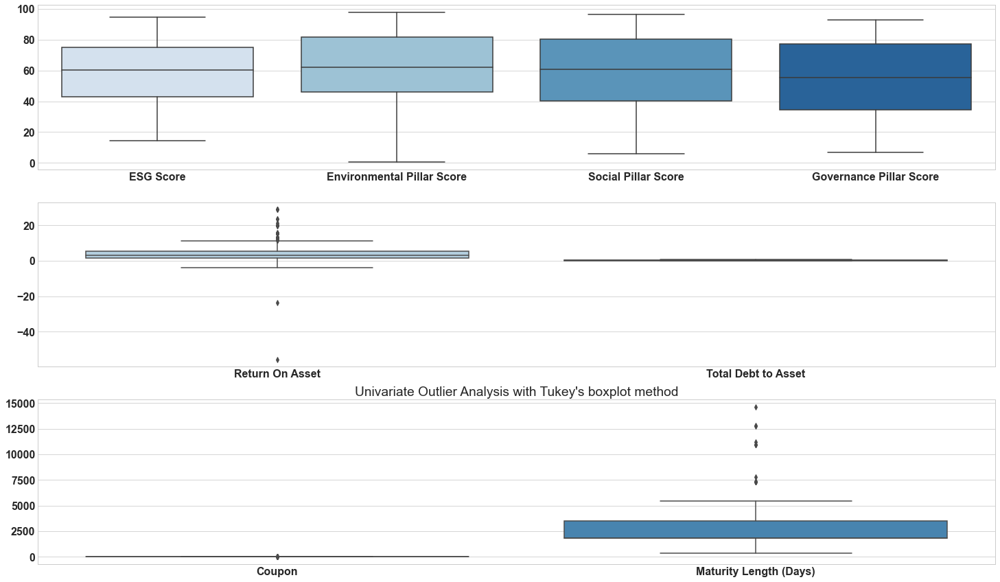

,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days)
0,73.4,59.11,96.42,55.23,2.2,0.6,2.1,730
1,89.06,92.93,90.27,83.41,3.0,0.34,2.75,2557
2,54.09,51.01,50.7,63.71,4.89,0.21,4.63,2091
3,64.28,86.11,56.46,48.35,6.97,0.22,0.02,1096
4,59.0,55.53,67.04,53.51,-0.3,0.42,1.97,730


In [42]:
## Univariate outliers - Tukey's boxplot method
cont_feat = df.drop(df.columns[[0,1,7,9,10,11,12,13,14,15,16,17,19,20,21,22]], axis = 1)
# visualize
fig, axes = plt.subplots(3,1,figsize=(25,15))
sns.boxplot(data=cont_feat.iloc[:,0:4], ax = axes[0], palette="Blues")
sns.boxplot(data=cont_feat.iloc[:,4:6], ax = axes[1], palette="Blues")
sns.boxplot(data=cont_feat.iloc[:,6:8], ax = axes[2], palette="Blues")
plt.title("Univariate Outlier Analysis with Tukey's boxplot method")
plt.show()
cont_feat.head(5)

<b>Encoding categorical variables</b>

In [43]:
# One hot encoding categorical features
df1 = pd.get_dummies(df['Market of Issue'])
df2 = pd.get_dummies(df['Country of Issue'])
df3 = pd.get_dummies(df['Sector'])
df4 = pd.get_dummies(df['Use of Proceeds'])
df5 = pd.get_dummies(df['Principal Currency'])
df6 = pd.get_dummies(df['Issuer Credit Rating'])
comb = [df, df1, df2, df3, df4, df5, df6]
new = pd.concat(comb, axis = 1)
new

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,TH0221032B04,4295892710,73.4,59.11,96.42,55.23,2.2,7.95,0.6,0.06,...,0,0,0,0,0,0,1,0,0,0
1,FR0013048204,4295867555,89.06,92.93,90.27,83.41,3.0,6.38,0.34,0.04,...,0,0,0,0,0,0,1,0,0,0
2,NZCEND0040L1,4295885081,54.09,51.01,50.7,63.71,4.89,6.74,0.21,0.05,...,0,0,1,0,0,0,0,0,0,0
3,JP373480AKB4,4295876533,64.28,86.11,56.46,48.35,6.97,11.13,0.22,0.0,...,0,0,0,0,0,0,1,0,0,0
4,SE0013882743,4295889919,59.0,55.53,67.04,53.51,-0.3,2.38,0.42,0.05,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,JP356680AN38,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,0,0,0,0,0,0,1,0,0,0
456,JP356680AN53,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,0,0,0,0,0,0,1,0,0,0
457,JP358260BK34,4295878581,56.51,82.86,54.39,33.38,3.36,10.59,0.58,0.01,...,0,0,1,0,0,0,0,0,0,0
458,FR0014003GT5,8589934326,94.61,94.13,95.92,93.01,0.41,6.7,0.06,0.03,...,0,0,0,0,0,0,0,0,0,0


<b>Choosing features</b>

In [44]:
# Choose features and re-organize the order of variables
x = new.drop(new.columns[[0,1,7,9,10,11,12,13,14,15,16,17,19,20,21]], axis = 1)
first_column = x.pop('NORMALIZED Amount Issued (USD)')
x.insert(0, 'Amount Issued (USD)', first_column)
x.columns.tolist()

['Amount Issued (USD)',
 'ESG Score',
 'Environmental Pillar Score',
 'Social Pillar Score',
 'Governance Pillar Score',
 'Return On Asset',
 'Total Debt to Asset',
 'Coupon',
 'Maturity Length (Days)',
 'Domestic',
 'Eurobond',
 'Foreign',
 'Global',
 'Argentina',
 'Belgium',
 'China',
 'Colombia',
 'European Union',
 'Finland',
 'France',
 'Germany',
 'India',
 'Japan',
 'New Zealand',
 'Norway',
 'Philippines',
 'Slovakia',
 'South Africa',
 'South Korea',
 'Spain',
 'Sweden',
 'Switzerland',
 'Taiwan',
 'Thailand',
 'United States',
 'Airline',
 'Automotive',
 'Banking',
 'Beverage/Bottling',
 'Building Products',
 'Chemicals',
 'Conglomerate',
 'Electronics',
 'Financial ',
 'Food Processors',
 'Gas Utility',
 'Health Care',
 'Home Builders',
 'Industrials ',
 'Information Technology',
 'Insurance',
 'Leasing',
 'Life Insurance',
 'Machinery',
 'Metals/Mining',
 'Oil and Gas',
 'Publishing',
 'Railroads',
 'Real Estate',
 'Retail Stores ',
 'Securities',
 'Service ',
 'Telecommuni

In [45]:
x.head(5)

,Amount Issued (USD),ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days),Domestic,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,0.005707,73.4,59.11,96.42,55.23,2.2,0.6,2.1,730,1,...,0,0,0,0,0,0,1,0,0,0
1,0.020308,89.06,92.93,90.27,83.41,3.0,0.34,2.75,2557,1,...,0,0,0,0,0,0,1,0,0,0
2,0.024527,54.09,51.01,50.7,63.71,4.89,0.21,4.63,2091,1,...,0,0,1,0,0,0,0,0,0,0
3,0.141674,64.28,86.11,56.46,48.35,6.97,0.22,0.02,1096,1,...,0,0,0,0,0,0,1,0,0,0
4,0.013269,59.0,55.53,67.04,53.51,-0.3,0.42,1.97,730,1,...,0,0,0,0,0,1,0,0,0,0


## 1.4 Relationship analysis 

<b>Barua and Chiesa (2019)</b> studied a wide range of factors that influence the supply size of green bond using cross‐section Ordinary Least Square regressions and tested if the effect of each factor persists over time and across rating grade estimations via Blinder-Oaxaca decomposition analysis. Factors are classified into three categories: bond's characteristics, firm specifics and market specifics. However the effect size varies. Some of the significant factors include <b>coupon rate</b> (which has a negative effect on the issue size), credit rating (which has a positive effect), revenue growth (negative effect) and profitability (positive effect), principal currency and market of issuance.
* Target variable is not normally distributed, rather rightly skewed (Mode > Median > Mean). Non-negative variable.

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


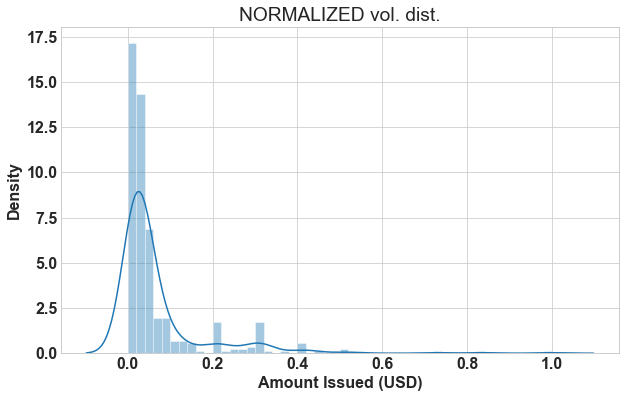

In [106]:
plt.figure(figsize=(10,6))
sns.distplot(x['Amount Issued (USD)']), plt.title('NORMALIZED vol. dist.')
plt.show()

### a. Continuous predictors vs Target
Pair plots and heat maps help in identifying highly correlated features (multicollinearity detection)
Multicollinearity affects the coefficients and p-values but it does not influence the predictions, the precision of the predictions, or the goodness-of-fit statistics. In other words, no massive bearing on the model's predictive capababilities. It only affects the specific independent variables that are correlated.

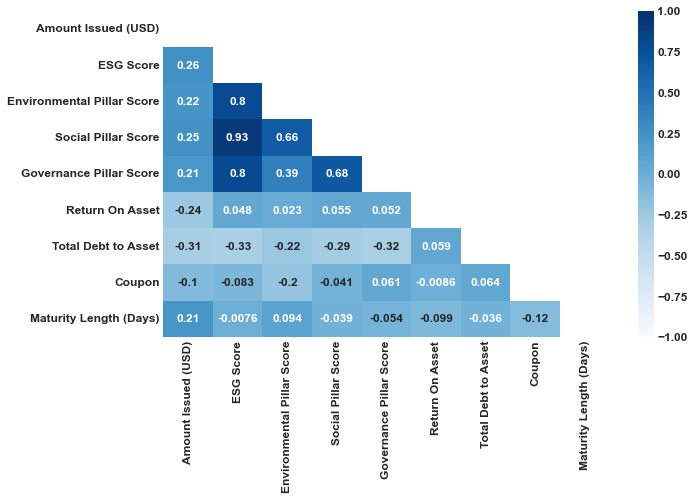

In [47]:
plt.rcParams.update({'font.size': 12})
# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(x.iloc[:,:9].corr(), dtype=bool))
# Plot heatmap for correlation
plt.figure(figsize=(10,6))
correlation = x.iloc[:,:9].corr()
sns.heatmap(correlation, xticklabels = correlation.columns, yticklabels = correlation.columns, 
            annot = True, mask=mask, vmin=-1, vmax=1, cmap="Blues")
plt.xticks(rotation=90) 
plt.show()

In [48]:
# check for outliers?
cont_feat = x.iloc[:,:9]
# visualize
#plt.figure(figsize =(50,35))
#plt.subplot(511), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Use of Proceeds")
#plt.subplot(512), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Sector")
#plt.subplot(513), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Principal Currency")
#plt.subplot(514), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Market of Issue")
#plt.subplot(515), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Country of Issue")
#plt.show()
cont_feat.describe()

,Amount Issued (USD),ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days)
count,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000
mean,0.067723,58.732457,61.261609,58.495370,54.993761,4.134152,0.342348,2.120261,2536.239130
std,0.110585,19.728627,22.752520,24.338702,23.280292,5.512163,0.161925,2.857278,1718.801917
min,0.000000,14.270000,0.720000,5.960000,6.690000,-55.600000,0.000000,0.000000,365.000000
25%,0.016597,42.830000,46.055000,40.160000,34.410000,1.480000,0.210000,0.450000,1826.000000
50%,0.028198,60.200000,62.230000,60.880000,55.230000,3.070000,0.360000,1.655000,1827.000000
75%,0.056567,75.180000,81.737500,80.182500,77.220000,5.350000,0.452500,2.972500,3534.750000
max,1.000000,94.610000,97.920000,96.420000,93.010000,28.920000,0.790000,48.020000,14610.000000


<Figure size 2160x2160 with 0 Axes>

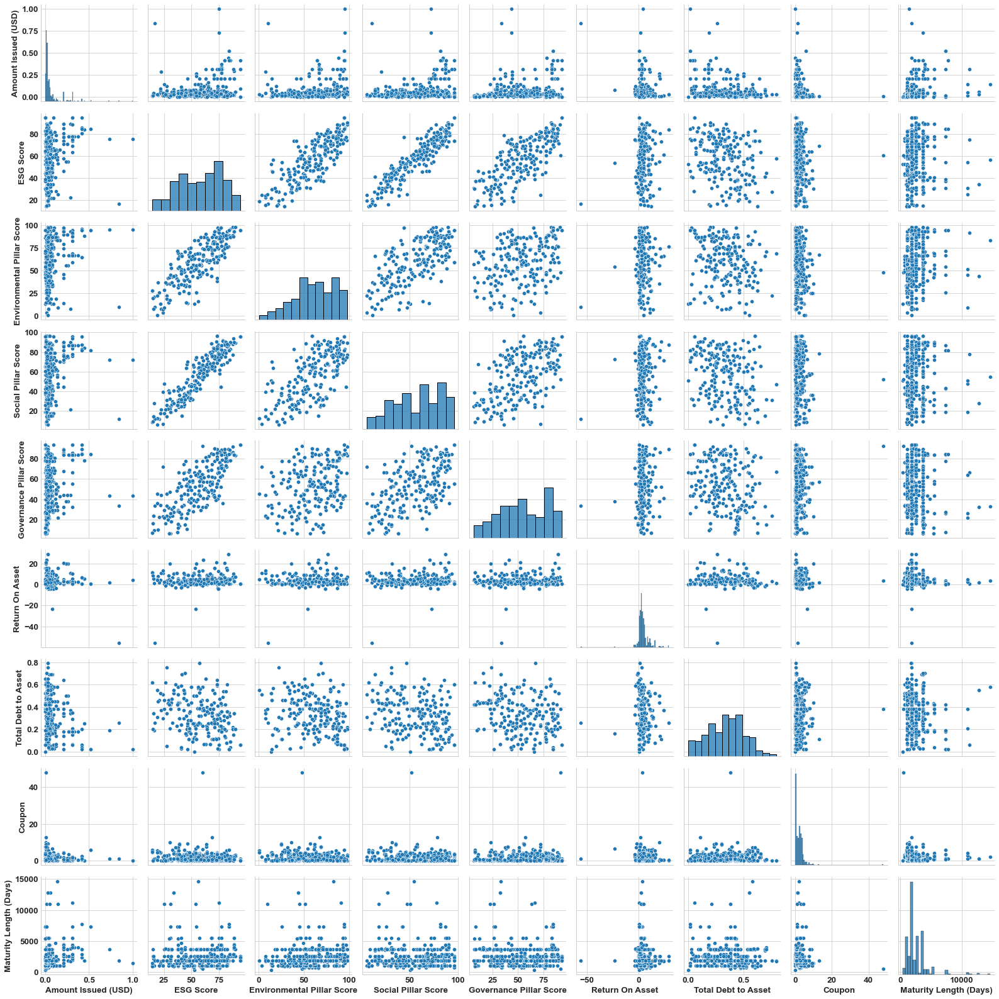

In [49]:
# show distribution to show data shape and scatter plot to detect outliers for each cont. feature
plt.rcParams.update({'font.size': 13.5})
plt.figure(figsize=(30,30))
sns.pairplot(x.iloc[:,:9], palette="Blues")
plt.show()

### b. Categorical predictors

In [50]:
# check for outliers?
cat_feat = df.drop(df.columns[[0,1,2,3,4,5,6,7,8,9,16,17,18,19,20,21,23]], axis = 1)
# visualize
#plt.figure(figsize =(50,35))
#plt.subplot(511), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Use of Proceeds")
#plt.subplot(512), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Sector")
#plt.subplot(513), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Principal Currency")
#plt.subplot(514), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Market of Issue")
#plt.subplot(515), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Country of Issue")
#plt.show()
cat_feat

,Issuer Credit Rating,Market of Issue,Country of Issue,Sector,Use of Proceeds,Principal Currency,NORMALIZED Amount Issued (USD)
0,BBB,Domestic,Thailand,Transportation,Clean Transport,Thai Baht,0.005707
1,BBB,Domestic,France,Real Estate,Eligible Green Projects,Euro,0.020308
2,AA-,Domestic,New Zealand,Utility,Energy Efficiency,New Zealand Dollar,0.024527
3,BBB,Domestic,Japan,Electronics,Eligible Green Projects,Japanese Yen,0.141674
4,BB-,Domestic,Sweden,Home Builders,Clean Transport,Swedish Krona,0.013269
...,...,...,...,...,...,...,...
455,BBB,Domestic,Japan,Railroads,Clean Transport,Japanese Yen,0.056567
456,BBB,Domestic,Japan,Railroads,Clean Transport,Japanese Yen,0.028198
457,AA-,Domestic,Japan,Service,Energy Efficiency,Japanese Yen,0.141674
458,A+,Domestic,France,Banking,Energy Efficiency,Euro,0.002659


In [51]:
new_cat_feat = cat_feat.drop(cat_feat.columns[[6]], axis = 1)
new_cat_feat.describe()

,Issuer Credit Rating,Market of Issue,Country of Issue,Sector,Use of Proceeds,Principal Currency
count,460,460,460,460,460,460
unique,13,4,22,31,21,17
top,A+,Domestic,Japan,Home Builders,Energy Efficiency,Japanese Yen
freq,127,426,132,71,148,132


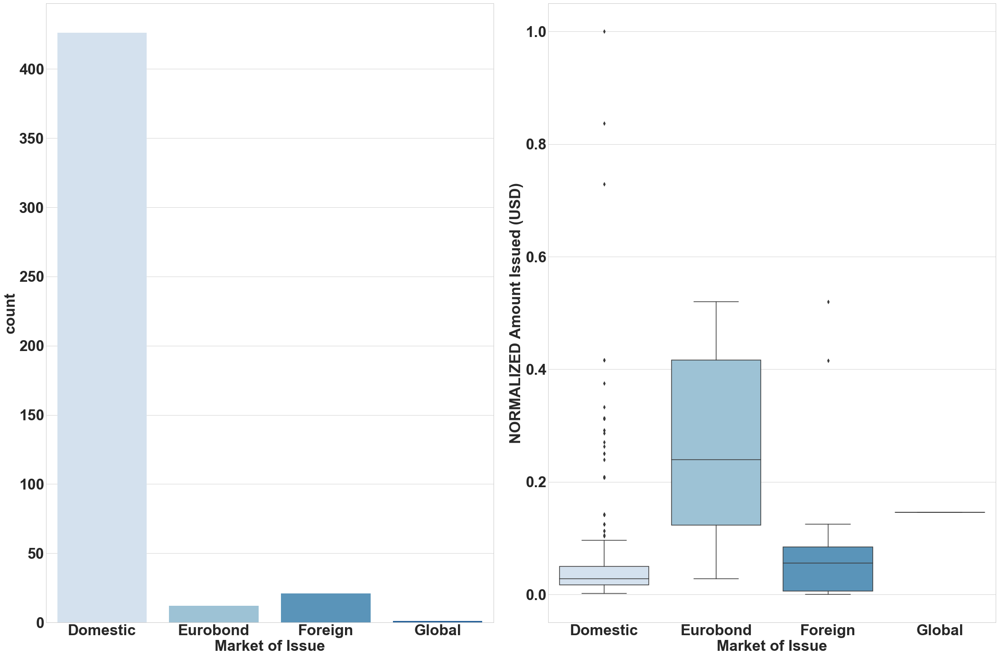

In [52]:
sns.color_palette("mako", as_cmap=True)
plt.rcParams.update({'font.size': 32})
# plot heatmap for correlation
fig1 = plt.figure(figsize = (30,20))

ax1 = fig1.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Market of Issue', ax=ax1, palette="Blues")

ax4 = fig1.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Market of Issue', y = 'NORMALIZED Amount Issued (USD)' , ax=ax4, palette="Blues")

fig1.tight_layout()

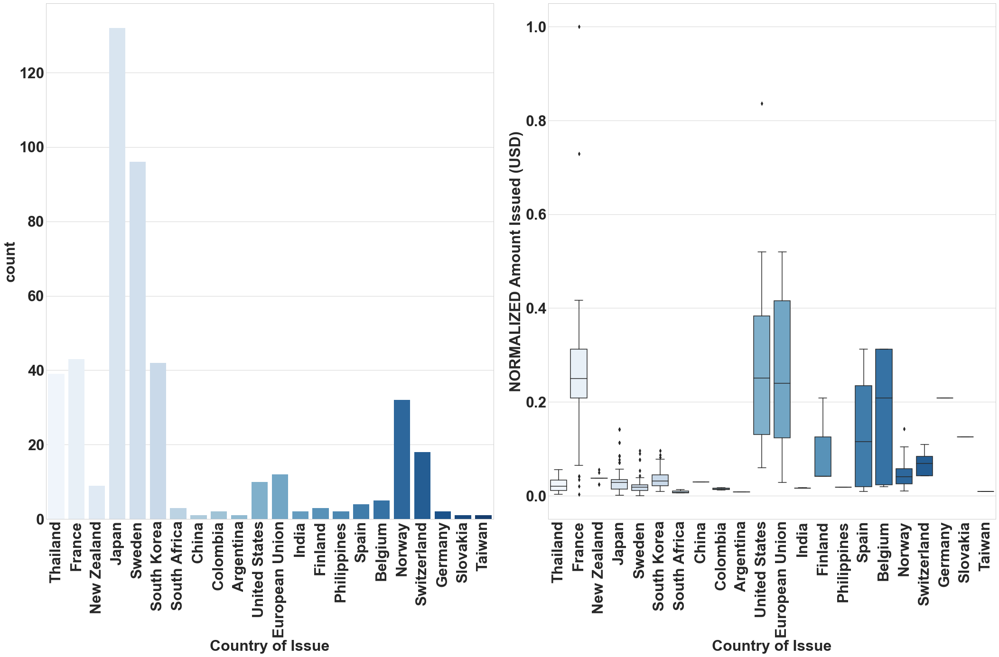

In [53]:
sns.color_palette("mako", as_cmap=True)
plt.rcParams.update({'font.size': 32})
# plot heatmap for correlation
fig1 = plt.figure(figsize = (30,20))

ax2 = fig1.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Country of Issue', ax=ax2, palette="Blues")
ax2.tick_params(axis='x', labelrotation = 90)

ax5 = fig1.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Country of Issue', y = 'NORMALIZED Amount Issued (USD)', ax=ax5, palette="Blues")
ax5.tick_params(axis='x', labelrotation = 90)

fig1.tight_layout()

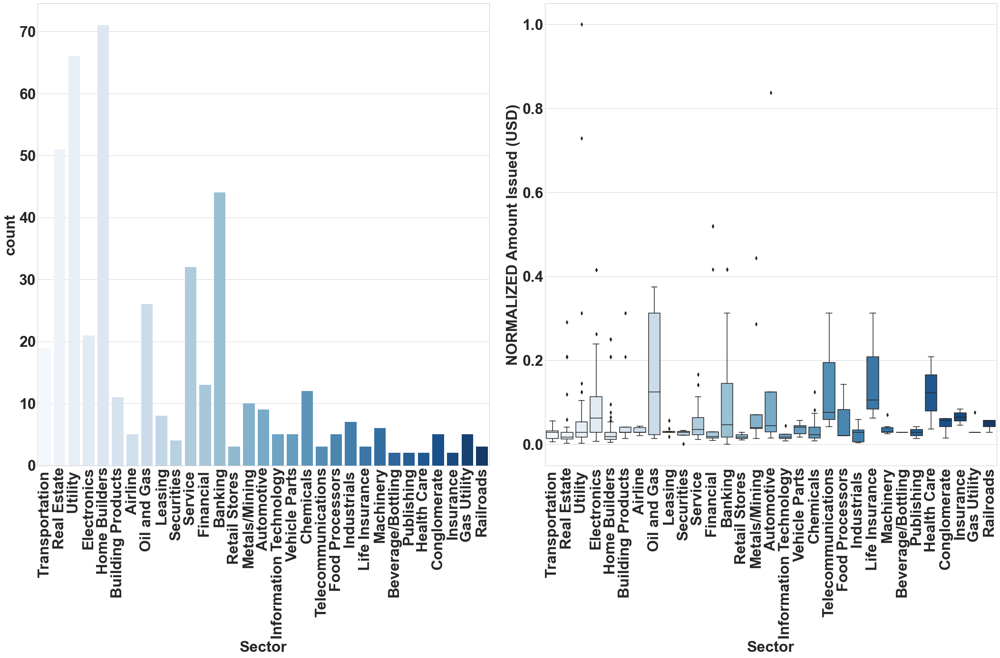

In [54]:
plt.rcParams.update({'font.size': 32})
fig2 = plt.figure(figsize = (30,20))

ax1 = fig2.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Sector', ax=ax1, palette="Blues")
ax1.tick_params(axis='x', labelrotation = 90)

ax4 = fig2.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Sector', y = 'NORMALIZED Amount Issued (USD)' , ax=ax4, palette="Blues")
ax4.tick_params(axis='x', labelrotation = 90)

fig2.tight_layout()

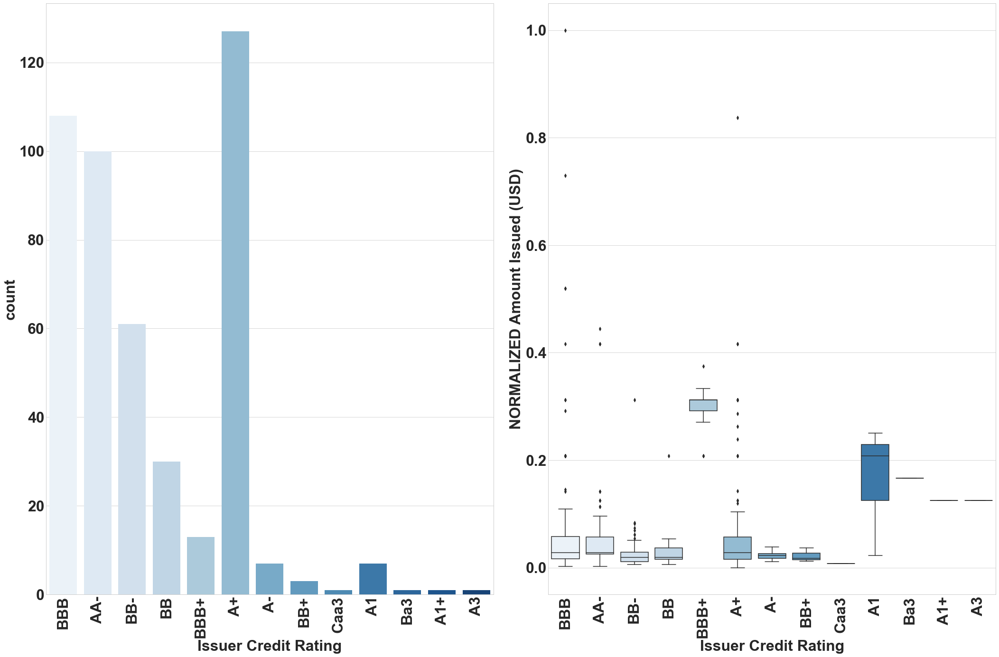

In [55]:
plt.rcParams.update({'font.size': 32})
fig2 = plt.figure(figsize = (30,20))

ax2 = fig2.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Issuer Credit Rating', ax=ax2, palette="Blues")
ax2.tick_params(axis='x', labelrotation = 90)

ax5 = fig2.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Issuer Credit Rating', y = 'NORMALIZED Amount Issued (USD)', ax=ax5, palette="Blues")
ax5.tick_params(axis='x', labelrotation = 90)

fig2.tight_layout()

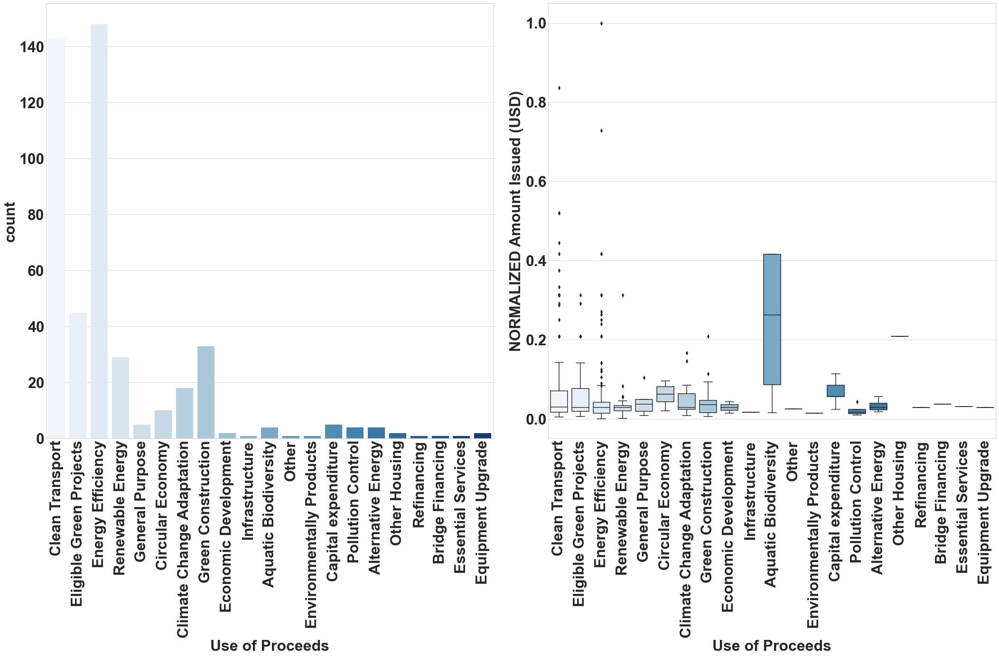

In [56]:
plt.rcParams.update({'font.size': 32})
fig3 = plt.figure(figsize = (30,20))

ax8 = fig3.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Use of Proceeds', ax=ax8, palette="Blues")
ax8.tick_params(axis='x', labelrotation = 90)

ax11 = fig3.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Use of Proceeds', y = 'NORMALIZED Amount Issued (USD)', ax=ax11, palette="Blues")
ax11.tick_params(axis='x', labelrotation = 90)

fig3.tight_layout()

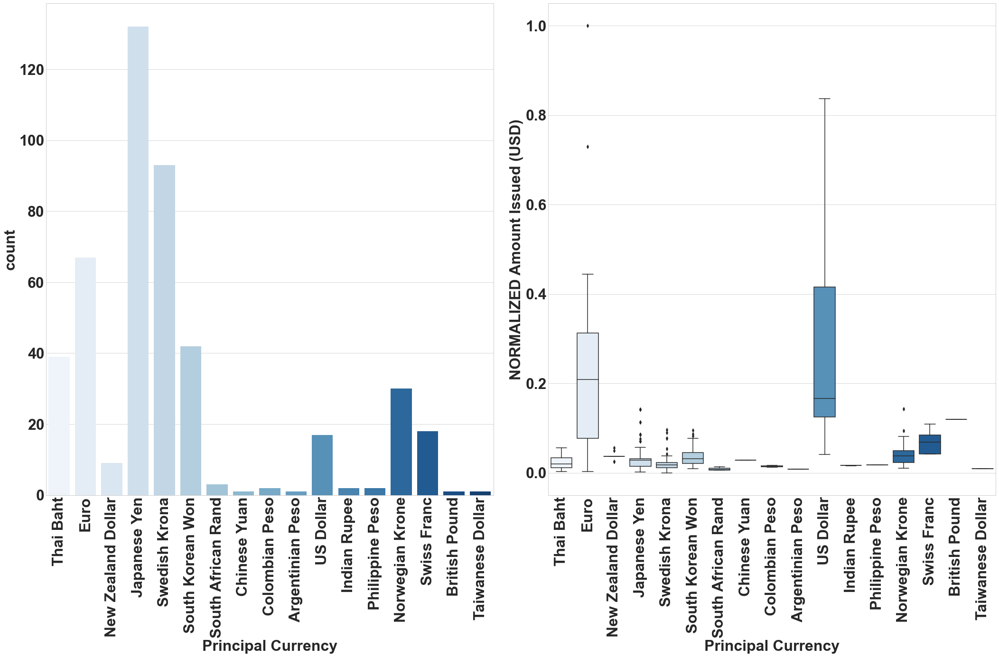

In [57]:
plt.rcParams.update({'font.size': 32})
fig3 = plt.figure(figsize = (30,20))

ax9 = fig3.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Principal Currency', ax=ax9, palette="Blues")
ax9.tick_params(axis='x', labelrotation = 90)

ax12 = fig3.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Principal Currency', y = 'NORMALIZED Amount Issued (USD)', ax=ax12, palette="Blues")
ax12.tick_params(axis='x', labelrotation = 90)


fig3.tight_layout()

# 2. Model build 

## 2.1  Nested cross validation method

Using the x dataset. 

In [58]:
print("Dataset has {} entries and {} features".format(*x.shape))

Dataset has 460 entries and 117 features


In [59]:
predictors = x.iloc[:,1:]
targets = x.iloc[:,0]
# Set k-fold and initiate the list of algorithms to be run
inner_cv = KFold(n_splits=4, shuffle=True, random_state=1)
outer_cv = KFold(n_splits=5, shuffle=True, random_state=1)

### Linear Regression and Ridge Regression

<b>Linear Regression</b>
* fit_intercept[default=True]. 
Whether to calculate the intercept for this model. If set to False, no intercept will be used in calculations (i.e. data is expected to be centered). When fit_intercept=True, the line of best fit is allowed to "fit" the y-axis. When fit_intercept=False, the intercept is forced to the origin (0, 0). https://stackoverflow.com/questions/46779605/in-the-linearregression-method-in-sklearn-what-exactly-is-the-fit-intercept-par

* normalize[default=False].
This parameter is ignored when fit_intercept is set to False. If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. If you wish to standardize, please use StandardScaler before calling fit on an estimator with normalize=False. Deprecated since version 1.0: normalize was deprecated in version 1.0 and will be removed in 1.2.

* copy_X[default=True].
If True, X will be copied; else, it may be overwritten. The input X when trying to fit the model will, if the flag is set to true (default), be copied for use within the function. This means that the original X passed as a parameter will be the same after the fit has been performed. If the flag i set to false, there is a chance that the X will NOT be the same as it was before fit. https://stackoverflow.com/questions/53711167/what-is-the-meaning-of-copy-x-in-sklearn-linear-models#:~:text=On%20the%20documentation%20for%20Linear,for%20use%20within%20the%20function.

* n_jobs[default=None].
The number of jobs to use for the computation. This will only provide speedup in case of sufficiently large problems, that is if firstly <b>n_targets > 1</b> and secondly X is sparse or if positive is set to True. None means 1 unless in a joblib.parallel_backend context. -1 means using all processors. See Glossary for more details.

* positive[default=False].
When set to True, forces the coefficients to be positive. This option is only supported for dense arrays.
https://stackoverflow.com/questions/35986627/linear-regression-with-positive-coefficients-in-python

In [60]:
def linear_regression_nCV(features, target, inner_cv, outer_cv):
    # Define gridsearch for model tuning on the inner_cv
    def LR_gridsearchcv_tuning(Xtrain, ytrain):
        LRmodel = LinearRegression()
        params_LR = [{'fit_intercept': [True, False], 'positive': [False], 'copy_X': [True]}]
        grid_LR = GridSearchCV(LRmodel, params_LR,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        start_time = time.time()
        grid_LR.fit(Xtrain, ytrain)
        LR_tuning = time.time() - start_time
        LRBest_params = grid_LR.best_params_
        LRBest_score = grid_LR.best_score_
        return LR_tuning, LRBest_params, LRBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators =[]
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        LRAvg_tuning_time, LRBest_estimators, LRBest_score =  LR_gridsearchcv_tuning(Xtrain, ytrain)
        best_lr_model = LinearRegression().set_params(**LRBest_estimators)
        fitted_model = best_lr_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(LRAvg_tuning_time)
        estimators.append(LRBest_estimators)
        # show evaluation metric values
    LRscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                       'Average tuning time': tuning_time, 
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    LRpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, LRpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(LRpredictions), max(ytest))
    p2 = min(min(LRpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return LRscores.T,LRpredictions.T

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert y

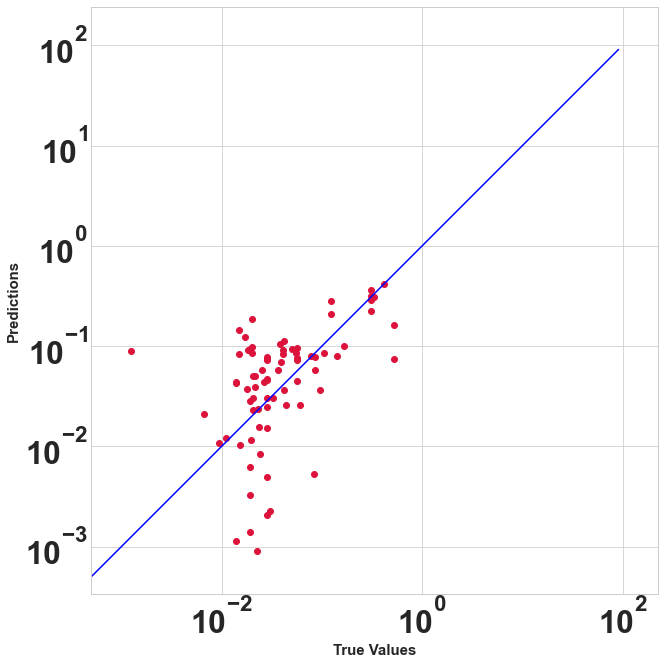

In [61]:
LRscores,LRpredictions = linear_regression_nCV(predictors, targets, inner_cv, outer_cv)

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert you

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric 

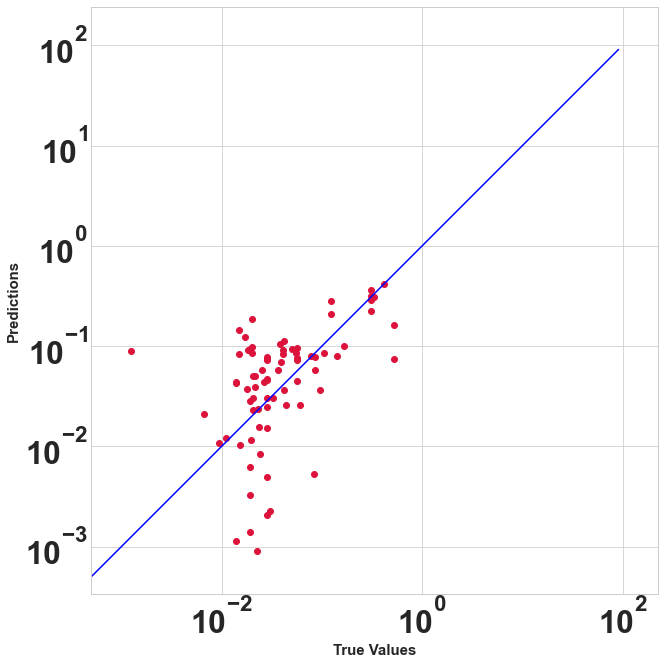

(                                        Set of hyperparameters  \
 0  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 1  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 2   {'copy_X': True, 'fit_intercept': True, 'positive': False}   
 3  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 4  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 
   Average tuning time      RMSE       MAE        R2  
 0            0.090032  0.068484  0.041542   0.51945  
 1            0.168718  0.069426  0.046958  0.399886  
 2            0.278148   0.10434  0.052634   0.24429  
 3            0.148991  0.103941  0.048834  0.386451  
 4             0.15218  0.103172  0.052097  0.024443  ,
            0         1         2         3         4
 0   0.045164  0.007306  0.015693  0.031775  0.184542
 1   0.035010  0.042124  0.002476  0.033231  0.079778
 2   0.014260  0.039780  0.310768 -0.070741  0.023016
 3  -0.052463  0.080071 -0.016552  0.006105  0.00

In [62]:
linear_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [63]:
LRscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.123266,0.068484,0.041542,0.51945
1,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.101991,0.069426,0.046958,0.399886
2,"{'copy_X': True, 'fit_intercept': True, 'positive': False}",0.098397,0.10434,0.052634,0.24429
3,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.09661,0.103941,0.048834,0.386451
4,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.100418,0.103172,0.052097,0.024443


<b>Ridge Regression</b>

Ridge Regression Penalty resulted in a smaller slope which ultimately makes the predictions less sensitive to the training data. Ridge Regression minimises the sum of squared residuals + lambda times sum of all squared parameters except from the y-intercept. Alpha = Lambda (L2 regularization) increases variance decreases. The whole point of using Ridge is because of the small sample size can lead to poor Least Squares estimates that result in bad ML predictions. 

* alpha{float, ndarray of shape (n_targets,)}[default=1.0]
Constant that multiplies the L2 term, controlling regularization strength. alpha must be a non-negative float i.e. in [0, inf).
When alpha = 0, the objective is equivalent to ordinary least squares, solved by the LinearRegression object. For numerical reasons, using alpha = 0 with the Ridge object is not advised. Instead, you should use the LinearRegression object.
If an array is passed, penalties are assumed to be specific to the targets. Hence they must correspond in number.

* fit_intercept[default=True]
Whether to fit the intercept for this model. If set to false, no intercept will be used in calculations (i.e. X and y are expected to be centered).

* normalize[default=False]
This parameter is ignored when fit_intercept is set to False. If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. If you wish to standardize, please use StandardScaler before calling fit on an estimator with normalize=False.
Deprecated since version 1.0: normalize was deprecated in version 1.0 and will be removed in 1.2.

* copy_X[default=True]
If True, X will be copied; else, it may be overwritten.

* max_iter[default=None]
Maximum number of iterations for conjugate gradient solver. For ‘sparse_cg’ and ‘lsqr’ solvers, the default value is determined by scipy.sparse.linalg. For ‘sag’ solver, the default value is 1000. For ‘lbfgs’ solver, the default value is 15000.

* tol[default=1e-3]
Precision of the solution.

* solver{‘auto’, ‘svd’, ‘cholesky’, ‘lsqr’, ‘sparse_cg’, ‘sag’, ‘saga’, ‘lbfgs’}[default=’auto’]
Solver to use in the computational routines:

  **‘auto’ chooses the solver automatically based on the type of data.

  **‘svd’ uses a Singular Value Decomposition of X to compute the Ridge coefficients. It is the most stable solver, in particular more stable for singular matrices than ‘cholesky’ at the cost of being slower.

  **‘cholesky’ uses the standard scipy.linalg.solve function to obtain a closed-form solution.

  **‘sparse_cg’ uses the conjugate gradient solver as found in scipy.sparse.linalg.cg. As an iterative algorithm, this solver is more appropriate than ‘cholesky’ for large-scale data (possibility to set tol and max_iter).

  **‘lsqr’ uses the dedicated regularized least-squares routine scipy.sparse.linalg.lsqr. It is the fastest and uses an iterative procedure.

  **‘sag’ uses a Stochastic Average Gradient descent, and ‘saga’ uses its improved, unbiased version named SAGA. Both methods also use an iterative procedure, and are often faster than other solvers when both n_samples and n_features are large. Note that ‘sag’ and ‘saga’ fast convergence is only guaranteed on features with approximately the same scale. You can preprocess the data with a scaler from sklearn.preprocessing.

  **‘lbfgs’ uses L-BFGS-B algorithm implemented in scipy.optimize.minimize. It can be used only when positive is True.
All solvers except ‘svd’ support both dense and sparse data. However, only ‘lsqr’, ‘sag’, ‘sparse_cg’, and ‘lbfgs’ support sparse input when fit_intercept is True.
New in version 0.17: Stochastic Average Gradient descent solver.
New in version 0.19: SAGA solver.

* positive[default=False]
When set to True, forces the coefficients to be positive. Only ‘lbfgs’ solver is supported in this case.

* random_stateint[default=None]
Used when solver == ‘sag’ or ‘saga’ to shuffle the data. See Glossary for details.
New in version 0.17: random_state to support Stochastic Average Gradient.

In [64]:
def ridge_regression_nCV(features, target, inner_cv, outer_cv):
    # Define gridsearch for model tuning on the inner_cv
    def Ri_gridsearchcv_tuning(Xtrain, ytrain):
        Rimodel = Ridge()
        params_Ri = [{'fit_intercept': [True, False], 'alpha':list(range(1,20,1)), 'positive': [False], 'copy_X': [True], 'tol': [0.001]}]
        grid_Ri = GridSearchCV(Rimodel, params_Ri,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        start_time = time.time()
        grid_Ri.fit(Xtrain, ytrain)
        Ri_tuning = time.time() - start_time
        RiBest_params = grid_Ri.best_params_
        RiBest_score = grid_Ri.best_score_
        return Ri_tuning, RiBest_params, RiBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        RiAvg_tuning_time, RiBest_estimators, RiBest_score =  Ri_gridsearchcv_tuning(Xtrain, ytrain)
        best_ri_model = Ridge().set_params(**RiBest_estimators)
        fitted_model = best_ri_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(RiAvg_tuning_time)
        estimators.append(RiBest_estimators)
        # show evaluation metric values
    Riscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                       'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    Ripredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, Ripredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(Ripredictions), max(ytest))
    p2 = min(min(Ripredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return Riscores.T,Ripredictions.T

In [65]:
def objective_Ri(trial):
    param = {
      'fit_intercept':trial.suggest_categorical('fit_intercept',['True', 'False']),
      'alpha':trial.suggest_float('alpha',1,10,log=True),
      'positive': trial.suggest_categorical('positive',['True', 'False']),
      'copy_X':trial.suggest_categorical("copy_X",['True', 'False']),
      'tol':trial.suggest_float("tol",0.01,1, log=True)
                    }
    model =Ridge(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
Ristudy = optuna.create_study(direction='minimize', study_name='regression')
Ristudy.optimize(objective_Ri, n_trials=100)
optuna.visualization.plot_optimization_history(Ristudy)

[I 2023-01-08 18:12:14,921] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-08 18:12:15,970] Trial 20 finished with value: 0.10838687583775333 and parameters: {'fit_intercept': 'True', 'alpha': 1.4559409502760896, 'positive': 'True', 'copy_X': 'True', 'tol': 0.04968940451716618}. Best is trial 19 with value: 0.10666287679320237.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-08 18:12:16,127] Trial 23 finished with value: 0.1079384624931691 and parameters: {'fit_intercept': 'True', 'alpha': 1.6582422207618523, 'positive': 'True', 'copy_X': 'True', 'tol': 0.022728469893782813}. Best is trial 19 with value: 0.10666287679320237.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users

[I 2023-01-08 18:12:16,286] Trial 26 finished with value: 0.10838573311965871 and parameters: {'fit_intercept': 'True', 'alpha': 1.7393529470539417, 'positive': 'True', 'copy_X': 'True', 'tol': 0.039218854070283485}. Best is trial 19 with value: 0.10666287679320237.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\User

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-08 18:12:16,441] Trial 29 finished with value: 0.10838573312019087 and parameters: {'fit_intercept': 'True', 'alpha': 1.2509784138041804, 'positive': 'False', 'copy_X': 'False', 'tol': 0.036503279779822095}. Best is trial 27 with value: 0.10666287621970316.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Us

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert y

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-08 18:12:16,822] Trial 37 finished with value: 0.10838941357868678 and parameters: {'fit_intercept': 'True', 'alpha': 1.3960091657391316, 'positive': 'False', 'copy_X': 'False', 'tol': 0.06750578791582312}. Best is trial 32 with value: 0.10666287619965271.
C:\Use

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert y

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

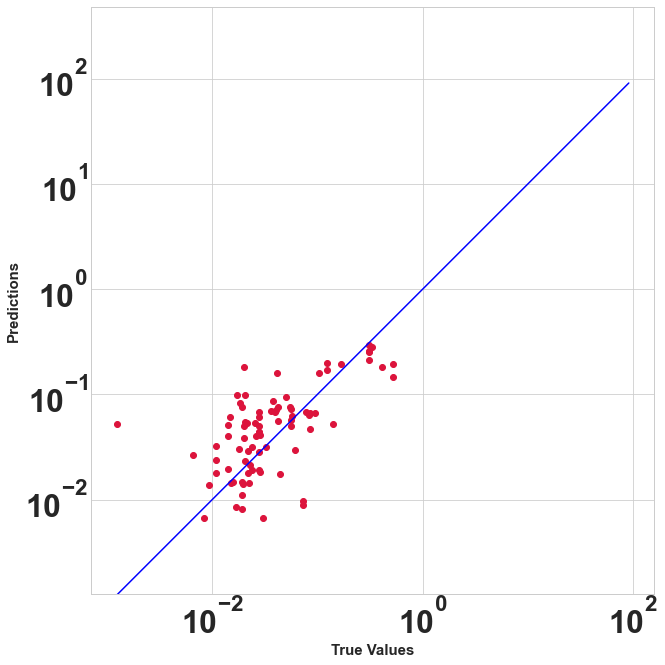

In [66]:
Riscores,Ripredictions = ridge_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [67]:
Riscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'alpha': 6, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.925234,0.066342,0.036743,0.549054
1,"{'alpha': 2, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.601928,0.058978,0.040098,0.566912
2,"{'alpha': 8, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.723159,0.09739,0.044694,0.341606
3,"{'alpha': 3, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.546204,0.104972,0.047624,0.374216
4,"{'alpha': 9, 'copy_X': True, 'fit_intercept': True, 'positive': False, 'tol': 0.001}",1.424263,0.090322,0.045386,0.252315


In [68]:
def objective_Ri(trial):
    param = {
      'fit_intercept':trial.suggest_categorical('fit_intercept',['True', 'False']),
      'alpha':trial.suggest_float('alpha',1,10,log=True),
      'positive': trial.suggest_categorical('positive',['True', 'False']),
      'copy_X':trial.suggest_categorical("copy_X",['True', 'False']),
      'tol':trial.suggest_float("tol",0.01,1, log=True)
                    }
    model =Ridge(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
Ristudy = optuna.create_study(direction='minimize', study_name='regression')
Ristudy.optimize(objective_Ri, n_trials=100)
optuna.visualization.plot_optimization_history(Ristudy)

[I 2023-01-09 03:51:38,995] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

### KNeighbors Regressor

The algorithm can work with relatively small datasets. The algorithm is simple and easy to implement. It can also be very easily tuned to improve its accuracy. 

The algorithm gets significantly slower as the number of examples and/or predictors/independent variables increase as it have to account for every training point during prediction. The accuracy of the k-NN algorithm can be severely degraded by the presence of noisy or irrelevant features, or if the feature scales are not consistent with their importance. Also it is a non-interpretable model. It is very sensitive to outliers

* n_neighborsint[default=5]
Number of neighbors to use by default for kneighbors queries.

* weights{‘uniform’, ‘distance’}[default=’uniform’]
Weight function used in prediction. Possible values:
‘uniform’ : uniform weights. All points in each neighborhood are weighted equally.
‘distance’ : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.
Uniform weights are used by default.

* algorithm{‘auto’, ‘ball_tree’, ‘kd_tree’, ‘brute’}, default=’auto’
Algorithm used to compute the nearest neighbors:
  **‘ball_tree’ will use BallTree
  **‘kd_tree’ will use KDTree
  **‘brute’ will use a brute-force search.
  **‘auto’ will attempt to decide the most appropriate algorithm based on the values passed to fit method.
Note: fitting on sparse input will override the setting of this parameter, using brute force.

* leaf_size[default=30]
Leaf size passed to BallTree or KDTree. This can affect the speed of the construction and query, as well as the memory required to store the tree. The optimal value depends on the nature of the problem.The leaf size controls the minimum number of points in a given node, and effectively adjusts the tradeoff between the cost of node traversal and the cost of a brute-force distance estimate.  larger leaf size, the build time decreases: this is because fewer nodes need to be built. For very small leaf sizes, the query slows down because the algorithm must access many nodes to complete the query. For very large leaf sizes, the query slows down because there are too many pairwise distance computations. 

* p[default=2]
Power parameter for the Minkowski metric. When p = 1, this is equivalent to using manhattan_distance (l1), and euclidean_distance (l2) for p = 2. For arbitrary p, minkowski_distance (l_p) is used.

* metric[default=’minkowski’]
Metric to use for distance computation. Default is “minkowski”, which results in the standard Euclidean distance when p = 2. See the documentation of scipy.spatial.distance and the metrics listed in distance_metrics for valid metric values.

* metric_params[default=None]
Additional keyword arguments for the metric function.

* n_jobs[default=None]
The number of parallel jobs to run for neighbors search. None means 1 unless in a joblib.parallel_backend context. -1 means using all processors. See Glossary for more details. Doesn’t affect fit method.

In [69]:
def knn_regression_nCV(features, target, inner_cv, outer_cv):
    #def knr_gridsearchcv_tuning(Xtrain, ytrain):
        #KNRmodel = KNeighborsRegressor()
        #params_KNR = [{'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 
                       #'weights': ['distance'], 
                       #'metric': ['euclidean', 'minkowski'],
                       #'n_neighbors': list(range(1,25,1)), 
                       #'leaf_size': list(range(1,50,1))}]
        #grid_KNR = GridSearchCV(KNRmodel, params_KNR,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        #start_time = time.time()
        #grid_KNR.fit(Xtrain, ytrain)
        #KNR_tuning = time.time() - start_time
        #KNRBest_params = grid_KNR.best_params_
        #KNRBest_score = grid_KNR.best_score_
        #return KNR_tuning, KNRBest_params, KNRBest_score
    # Define optuna search for model tuning on the inner_cv
    def KNR_optuna_tuning(Xtrain, ytrain):
        def objective_KNR(trial):
            param = {
                    'algorithm':trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute']),
                    'weights':trial.suggest_categorical('weights',['distance', 'uniform']),
                    'metric': trial.suggest_categorical('metric', ['euclidean', 'minkowski']),
                    'n_neighbors':trial.suggest_int("n_neighbors",1,21,log=True),
                    'leaf_size':trial.suggest_int("leaf_size",1,50, log=True)
                    }
            model =KNeighborsRegressor(**param)
            model.fit(Xtrain,ytrain)
            return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        KNRstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        KNRstudy.optimize(objective_KNR, n_trials=100)
        KNR_tuning_time = time.time() - start_time
        KNRBest_params = KNRstudy.best_params
        KNRBest_score = KNRstudy.best_value
        return KNR_tuning_time, KNRBest_params, KNRBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        KNRAvg_tuning_time, KNRBest_estimators, KNRBest_score =  KNR_optuna_tuning(Xtrain, ytrain)
        best_knr_model = KNeighborsRegressor().set_params(**KNRBest_estimators)
        fitted_model = best_knr_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(KNRAvg_tuning_time)
        estimators.append(KNRBest_estimators)
        # show evaluation metric values
    KNRscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    KNRpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, KNRpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(KNRpredictions), max(ytest))
    p2 = min(min(KNRpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return KNRscores.T,KNRpredictions.T

[I 2023-01-09 08:31:18,177] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numer

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:20,257] Trial 25 finished with value: 0.09667024951471129 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 9}. Best is trial 21 with value: 0.09667024951471129.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:20,414] Trial 27 finished with value: 0.10759918503736535 and parameters: {'algorithm': 'ball_tree', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 14}. Best is trial 21 with value: 0.09667024951471129.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:20,566] Trial 29 finished with value: 0.09879109107766451 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 27}. Best is trial 21 with value: 0.09667024951471129.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:21,456] Trial 41 finished with value: 0.09667024951471129 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 4}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:21,597] Trial 43 finished with value: 0.09715735256895387 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 18, 'leaf_size': 9}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:21,737] Trial 45 finished with value: 0.09667024891232023 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 7}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:21,888] Trial 47 finished with value: 0.09726262633049321 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 17, 'leaf_size': 11}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/string

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:22,029] Trial 49 finished with value: 0.0972911234503912 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 16, 'leaf_size': 3}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:22,169] Trial 51 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:23,760] Trial 73 finished with value: 0.09679956954901191 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 19, 'leaf_size': 7}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:23,933] Trial 75 finished with value: 0.09667024891232023 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 7}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:24,088] Trial 77 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

[I 2023-01-09 08:31:25,110] Trial 91 finished with value: 0.09667024891232023 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 7}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings i

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:25,503] Trial 97 finished with value: 0.09667024891232023 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 5}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:25,650] Trial 99 finished with value: 0.10565374609435786 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 19, 'leaf_size': 4}. Best is trial 32 with value: 0.09667024891232023.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:25,773] Trial 1 finished wi

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:25,886] Trial 3 finished wi

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:25,996] Trial 5 finished wi

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:26,221] Trial 9 finished with value: 0.10903081701881799 and parameters: {'algorithm': 'brute', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 7}. Best is trial 4 with value: 0.09915382794798798.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/str

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:26,611] Trial 15 finished with value: 0.1001508599304737 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 7, 'leaf_size': 2}. Best is trial 12 with value: 0.09912990583797539.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:26,847] Trial 19 finished with value: 0.10961299793641023 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 1, 'leaf_size': 28}. Best is trial 12 with value: 0.09912990583797539.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:26,989] Trial 21 finished with value: 0.09920561861292136 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 14, 'leaf_size': 1}. Best is trial 12 with value: 0.09912990583797539.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:27,120] Trial 23 finished with value: 0.09915382794798798 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 15, 'leaf_size': 1}. Best is trial 12 with value: 0.09912990583797539.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:27,892] Trial 35 finished with value: 0.09964961686561803 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 11, 'leaf_size': 21}. Best is trial 24 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:29,364] Trial 55 finished with value: 0.1000021033754592 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 13, 'leaf_size': 7}. Best is trial 24 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:30,050] Trial 67 finished with value: 0.09970756496776864 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 8}. Best is trial 24 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:30,317] Trial 71 finished with value: 0.09920737883546961 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 13}. Best is trial 24 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:30,722] Trial 77 finished with value: 0.09915451633391237 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 15, 'leaf_size': 20}. Best is trial 24 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:32,738] Trial 9 finished with value: 0.09175837481089558 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 20, 'leaf_size': 8}. Best is trial 9 with value: 0.09175837481089558.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

[I 2023-01-09 08:31:32,859] Trial 11 finished with value: 0.0930134128847917 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 9}. Best is trial 9 with value: 0.09175837481089558.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:33,097] Trial 15 finished with value: 0.09175837481067006 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 20, 'leaf_size': 2}. Best is trial 15 with value: 0.09175837481067006.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:33,816] Trial 27 finished with value: 0.09191045814860799 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 17, 'leaf_size': 3}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:33,958] Trial 29 finished with value: 0.09331509041345613 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 6, 'leaf_size': 4}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:34,801] Trial 43 finished with value: 0.09191485568333513 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 17, 'leaf_size': 6}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:34,912] Trial 45 finished with value: 0.09556966769867636 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 2, 'leaf_size': 3}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings i

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:35,026] Trial 47 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:35,377] Trial 53 finished with value: 0.09168148994950996 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 6}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:35,491] Trial 55 finished with value: 0.09188251864572858 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 18, 'leaf_size': 7}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:35,604] Trial 57 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:35,723] Trial 59 finished with value: 0.09257996837386202 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 12, 'leaf_size': 3}. Best is trial 21 with value: 0.0916787040380201.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,175] Trial 67 finished with value: 0.0916619046127072 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 19, 'leaf_size': 4}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,488] Trial 73 finished with value: 0.0916619046127072 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 3}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,598] Trial 75 finished with value: 0.09230894018120787 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 13, 'leaf_size': 2}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is be

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,706] Trial 77 finished with value: 0.09240574955751163 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 14, 'leaf_size': 8}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,814] Trial 79 finished with value: 0.0924105206318038 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 3}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:36,924] Trial 81 finished with value: 0.0916619046127072 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 5}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:37,033] Trial 83 finished with value: 0.09234688420203334 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 5}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:37,377] Trial 89 finished with value: 0.09191045814860799 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 17, 'leaf_size': 10}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:37,486] Trial 91 finished with value: 0.0916619046127072 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 5}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:37,596] Trial 93 finished with value: 0.09234688420203334 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 4}. Best is trial 65 with value: 0.0916619046127072.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:38,365] Trial 7 finished with value: 0.0977095633516738 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 1, 'leaf_size': 1}. Best is trial 1 with value: 0.08096294536796651.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is bein

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:38,496] Trial 9 finished with value: 0.09216044687522515 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 4, 'leaf_size': 1}. Best is trial 1 with value: 0.08096294536796651.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is be

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:38,973] Trial 17 finished with value: 0.08004027463344578 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 12, 'leaf_size': 21}. Best is trial 12 with value: 0.07977413291260273.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:39,331] Trial 23 finished with value: 0.08024433154149603 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 16, 'leaf_size': 34}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:39,455] Trial 25 finished with value: 0.08004514990989246 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 8}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:39,833] Trial 31 finished with value: 0.08047944668965773 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 18}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:39,977] Trial 33 finished with value: 0.07977188644244466 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 20}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,107] Trial 35 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,226] Trial 37 finished with value: 0.08211123989310201 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 5, 'leaf_size': 8}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,373] Trial 39 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,510] Trial 41 finished with value: 0.0801494858544203 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 8, 'leaf_size': 2}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings i

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,655] Trial 43 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,791] Trial 45 finished with value: 0.09438517579320937 and parameters: {'algorithm': 'ball_tree', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 6, 'leaf_size': 18}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:40,956] Trial 47 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:41,107] Trial 49 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:41,259] Trial 51 finished with value: 0.07977413291260273 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 4}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:41,708] Trial 59 finished with value: 0.08096294536796651 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 6, 'leaf_size': 35}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:41,834] Trial 61 finished with value: 0.07977413291260273 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 45}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:43,612] Trial 89 finished with value: 0.08013811301726503 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 13, 'leaf_size': 23}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:43,878] Trial 93 finished with value: 0.07988124529114031 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 32}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:44,129] Trial 97 finished with value: 0.09609519277533189 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 11, 'leaf_size': 50}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:44,259] Trial 99 finished with value: 0.07977188644244466 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 25}. Best is trial 21 with value: 0.07977188644244466.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:46,706] Trial 40 finished with value: 0.10549493578248752 and parameters: {'algorithm': 'auto', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 11, 'leaf_size': 22}. Best is trial 39 with value: 0.10086191144977043.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

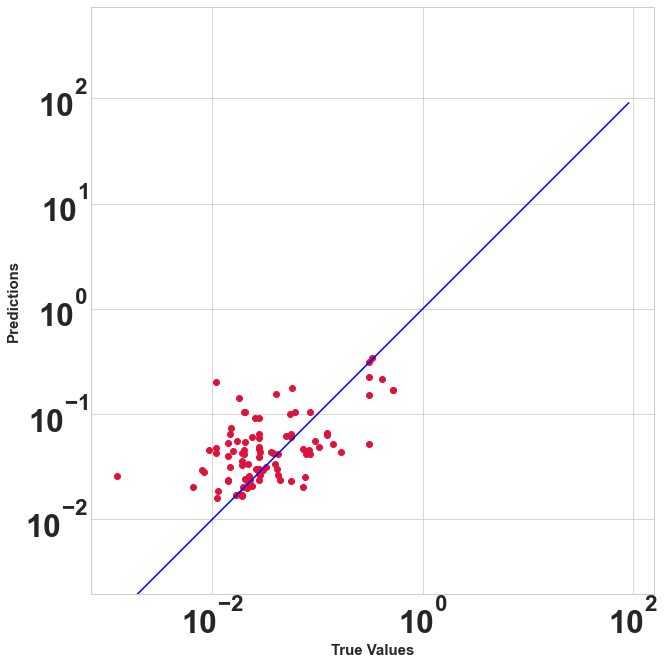

In [70]:
KNRscores,KNRpredictions = knn_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [71]:
KNRscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 7}",7.472115,0.103922,0.050883,-0.106549
1,"{'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 18, 'leaf_size': 10}",6.501302,0.070636,0.044485,0.378784
2,"{'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 19, 'leaf_size': 9}",5.751736,0.111606,0.048462,0.135381
3,"{'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 18}",6.31053,0.133058,0.062569,-0.005445
4,"{'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 13}",5.693372,0.078523,0.043527,0.434899


In [72]:
def objective_KNR(trial):
    param = {
      'algorithm':trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute']),
      'weights':trial.suggest_categorical('weights',['distance', 'uniform']),
      'metric': trial.suggest_categorical('metric', ['euclidean', 'minkowski']),
      'n_neighbors':trial.suggest_int("n_neighbors",1,10,log=True),
      'leaf_size':trial.suggest_int("leaf_size",1,50, log=True)
                    }
    model =KNeighborsRegressor(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
KNRstudy = optuna.create_study(direction='minimize', study_name='regression')
start_time = time.time()
KNRstudy.optimize(objective_KNR, n_trials=100)
optuna.visualization.plot_optimization_history(KNRstudy)

[I 2023-01-09 08:31:50,358] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numer

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:51,283] Trial 11 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 50}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

[I 2023-01-09 08:31:51,969] Trial 23 finished with value: 0.10272366306221477 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 6, 'leaf_size': 3}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is bein

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:53,176] Trial 41 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 46}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:53,321] Trial 43 finished with value: 0.10175697358356435 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 8, 'leaf_size': 34}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:53,786] Trial 49 finished with value: 0.10241229287150691 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 26}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:53,944] Trial 51 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 10, 'leaf_size': 16}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:54,074] Trial 53 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:54,195] Trial 55 finished with value: 0.10120059703894421 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 15}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

[I 2023-01-09 08:31:55,156] Trial 71 finished with value: 0.10120059703894421 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 29}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is bei

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:55,349] Trial 73 finished with value: 0.10175695330952877 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 8, 'leaf_size': 2}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:55,495] Trial 75 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 10, 'leaf_size': 19}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:55,910] Trial 81 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 42}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 08:31:56,913] Trial 95 finished with value: 0.10175695330952877 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 21}. Best is trial 11 with value: 0.1009928304683347.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

### XGBoost Regressor 

<b>General Parameters</b>
* booster[default = gbtree]: Use tree-based or linear models
* verbosity[default = 1]:  
* nthread [default = maximum number of threads available if not set]

There are other general parameters like disable_default_eval_metric [default=0], num_pbuffer [set automatically by XGBoost, no need to be set by user] and num_feature [set automatically by XGBoost, no need to be set by user].So, these parameters are taken care by XGBoost algorithm itself.

<b>Booster Parameters</b>
* eta [default=0.3, alias: learning_rate]: range : [0,1]. Typical final values : 0.01-0.2. Learning rates. Corresponds to the shrinkage of the weights associated to features after each round, in other words it defines the amount of "correction" we make at each step. Having a lower eta makes our model more robust to overfitting thus, usually, the lower the learning rate, the best. But with a lower eta, we need more boosting rounds, which takes more time to train, sometimes for only marginal improvements
* gamma [default=0, alias: min_split_loss]: Range: [0,∞]
* max_depth [default=6]: range: [0,∞] (0 is only accepted in lossguided growing policy when tree_method is set as hist): is the maximum number of nodes allowed from the root to the farthest leaf of a tree. Deeper trees can model more complex relationships by adding more nodes, but as we go deeper, splits become less relevant and are sometimes only due to noise, causing the model to overfit. Typical values: 3-10. 
* min_child_weight [default=1]: range: [0,∞]: is the minimum weight (or number of samples if all samples have a weight of 1) required in order to create a new node in the tree. A smaller min_child_weight allows the algorithm to create children that correspond to fewer samples, thus allowing for more complex trees, but again, more likely to overfit.
* max_delta_step [default=0]: Set it to value of 1-10 might help control the update. range: [0,∞]
* subsample [default=1]: Typical values: 0.5-1, range: (0,1]: corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows.
* colsample_bytree [default=1]: corresponds to the fraction of features (the columns) to use. By default it is set to 1 meaning that we will use all features.
* lambda [default=1, alias: reg_lambda]: L2 regularization term on weights. Increasing this value will make model more conservative.
* alpha [default=0, alias: reg_alpha]: L1 regularization term on weights (analogous to Lasso regression).
* tree_method string [default= auto]
* scale_pos_weight [default=1]

<b>Learning Task Parameters</b>
* objective [default=reg:squarederror]
* eval_metric [default according to objective]
* seed [default=0]

In [73]:
predictors.to_csv('predictors_s1.csv', header=False, index=False)
predictors_s1 = pd.read_csv('predictors_s1.csv', header = None, index_col = None)
targets.to_csv('target_s1.csv', header=False, index=False)
target_s1 = pd.read_csv('target_s1.csv', header = None, index_col = None)

In [74]:
def xgb_regression_nCV(features, target, inner_cv, outer_cv):
    # Define optuna search for model tuning on the inner_cv
    def xgb_optuna_tuning(Xtrain, ytrain):
        def objective_XGB(trial):
            param = {
                'max_depth': trial.suggest_int('max_depth', 2, 200),
                'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                # to control the complexity of the trees. 
                # tune these two together in order to find a good trade-off between model bias and variance
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                # to control the learning rates
                'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                # to control the sampling of the dataset that is done at each boosting round.
                # Instead of using the whole training set every time, we can build a tree on slightly different data at each step, 
                # which makes it less likely to overfit to a single sample or feature.
                'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                'gamma': trial.suggest_float('gamma', 0.01, 1.0),
                'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0)
                    }
            model = XGBRegressor(**param)
            model.fit(Xtrain, ytrain)
            return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        XGBstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        XGBstudy.optimize(objective_XGB, n_trials=100)
        XGB_tuning_time = time.time() - start_time
        XGBBest_params = XGBstudy.best_params
        XGBBest_score = XGBstudy.best_value
        return XGB_tuning_time, XGBBest_params, XGBBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        XGBAvg_tuning_time, XGBBest_estimators, XGBBest_score =  xgb_optuna_tuning(Xtrain, ytrain)
        best_xgb_model = XGBRegressor().set_params(**XGBBest_estimators)
        fitted_model = best_xgb_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(XGBAvg_tuning_time)
        estimators.append(XGBBest_estimators)
        # show evaluation metric values
    XGBscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    XGBpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, XGBpredictions.T.iloc[:,4], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(XGBpredictions), max(ytest))
    p2 = min(min(XGBpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return XGBscores.T,XGBpredictions.T

[I 2023-01-09 08:31:57,334] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:10,181] A n

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:12,593] Trial 4 finished with value: 0.11840204942625086 and parameters: {'max_depth': 182, 'min_child_weight': 1, 'learning_rate': 0.8297519562001722, 'subsample': 0.042427143782866474, 'colsample_bytree': 0.3136738019770384, 'n_estimators': 111, 'gamma': 0.5037997630840314, 'reg_alpha': 0.8994774911699178, 'reg_lambda': 0.5312061673171797}. Best is trial 1 with value: 0.08611524153069665.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Plea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:15,090] Trial 9 finished with value: 0.12077926707120919 and parameters: {'max_depth': 58, 'min_child_weight': 10, 'learning_rate': 0.32020809338340916, 'subsample': 0.03849838552413727, 'colsample_bytree': 0.3556152306085504, 'n_estimators': 78, 'gamma': 0.10783154856019028, 'reg_alpha': 0.9708745720851859, 'reg_lambda': 0.030437620366654282}. Best is trial 1 with value: 0.08611524153069665.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Pl

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:17,918] Trial 14 finished with value: 0.08135702758697524 and parameters: {'max_depth': 158, 'min_child_weight': 7, 'learning_rate': 0.8125067872517452, 'subsample': 0.9902809274878551, 'colsample_bytree': 0.018414758876018608, 'n_estimators': 144, 'gamma': 0.014596630388791883, 'reg_alpha': 0.5656853362383629, 'reg_lambda': 0.84849

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:22,468] Trial 19 finished with value: 0.08641971834853504 and parameters: {'max_depth': 143, 'min_child_weight': 6, 'learning_rate': 0.7970104637792497, 'subsample': 0.9098912731290466, 'colsample_bytree': 0.48216169923893376, 'n_estimators': 167, 'gamma': 0.17182607499009395, 'reg_alpha': 0.44724328764338317, 'reg_lambda': 0.881587

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:26,895] Trial 24 finished with value: 0.0794014222806117 and parameters: {'max_depth': 173, 'min_child_weight': 5, 'learning_rate': 0.3772805105655096, 'subsample': 0.9174874621595981, 'colsample_bytree': 0.4480960622508763, 'n_estimators': 199, 'gamma': 0.07647647219273554, 'reg_alpha': 0.6884681913238022, 'reg_lambda': 0.732218495

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:31,241] Trial 29 finished with value: 0.09481931164075101 and parameters: {'max_depth': 111, 'min_child_weight': 9, 'learning_rate': 0.5417618640574763, 'subsample': 0.9380873212780271, 'colsample_bytree': 0.8867354877736588, 'n_estimators': 98, 'gamma': 0.37805815408139753, 'reg_alpha': 0.5877748968468053, 'reg_lambda': 0.788069486

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:36,171] Trial 34 finished with value: 0.08540751594027107 and parameters: {'max_depth': 148, 'min_child_weight': 5, 'learning_rate': 0.08447086613939243, 'subsample': 0.7165975157587252, 'colsample_bytree': 0.687809790452685, 'n_estimators': 182, 'gamma': 0.2662554667042797, 'reg_alpha': 0.02013474022042311, 'reg_lambda': 0.68249759

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:41,110] Trial 39 finished with value: 0.10142489436002033 and parameters: {'max_depth': 179, 'min_child_weight': 4, 'learning_rate': 0.3809783156953271, 'subsample': 0.8229599394776514, 'colsample_bytree': 0.37070957882700734, 'n_estimators': 177, 'gamma': 0.419821530055707, 'reg_alpha': 0.6178485863463956, 'reg_lambda': 0.676095930

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:44,970] Trial 44 finished with value: 0.08000285716356 and parameters: {'max_depth': 173, 'min_child_weight': 6, 'learning_rate': 0.17505814287665297, 'subsample': 0.9995743403415626, 'colsample_bytree': 0.8526746548904697, 'n_estimators': 117, 'gamma': 0.06520790519373984, 'reg_alpha': 0.5378593341260883, 'reg_lambda': 0.7141534322

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:48,329] Trial 49 finished with value: 0.10892904720789748 and parameters: {'max_depth': 117, 'min_child_weight': 4, 'learning_rate': 0.41658998209089215, 'subsample': 0.45596581051500745, 'colsample_bytree': 0.6133285987246543, 'n_estimators': 79, 'gamma': 0.6279009817166729, 'reg_alpha': 0.5217268891823067, 'reg_lambda': 0.12462731848626665}. Best is trial 47 with value: 0.07509027289740573.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Pl

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:51,801] Trial 54 finished with value: 0.09392289762136374 and parameters: {'max_depth': 140, 'min_child_weight': 3, 'learning_rate': 0.5194487283817013, 'subsample': 0.2834716350620651, 'colsample_bytree': 0.3901816067930804, 'n_estimators': 117, 'gamma': 0.06460572540871994, 'reg_alpha': 0.4163164246431501, 'reg_lambda': 0.36293471

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:55,142] Trial 59 finished with value: 0.10871494726023369 and parameters: {'max_depth': 164, 'min_child_weight': 3, 'learning_rate': 0.15442219089733836, 'subsample': 0.790428609933724, 'colsample_bytree': 0.4554968371183395, 'n_estimators': 116, 'gamma': 0.8097260708291477, 'reg_alpha': 0.2700006962267424, 'reg_lambda': 0.221647669

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:45:58,139] Trial 64 finished with value: 0.07615599223908502 and parameters: {'max_depth': 103, 'min_child_weight': 5, 'learning_rate': 0.28098954437186296, 'subsample': 0.9231155686383666, 'colsample_bytree': 0.7234151540675848, 'n_estimators': 92, 'gamma': 0.030405860040661804, 'reg_alpha': 0.4614910529598607, 'reg_lambda': 0.2907986

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:46:00,886] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:46:20,479] Trial 3 finished with value: 0.09413307829663406 and parameters: {'max_depth': 141, 'min_child_weight': 9, 'learning_rate': 0.08487219992676281, 'subsample': 0.957859874239214, 'colsample_bytree': 0.9792022508385843, 'n_estimators': 100, 'gamma': 0.7544958391276776, 'reg_alpha': 0.25881885694561524, 'reg_lambda': 0.847717980

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:46:24,495] Trial 8 finished with value: 0.08361518418624808 and parameters: {'max_depth': 177, 'min_child_weight': 1, 'learning_rate': 0.6445086927422908, 'subsample': 0.3555923989892834, 'colsample_bytree': 0.17568558401245216, 'n_estimators': 168, 'gamma': 0.4790388715401842, 'reg_alpha': 0.10735417344484513, 'reg_lambda': 0.55248000

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:46:26,691] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:06,922] Trial 2 finished with value: 0.11555053118524342 and parameters: {'max_depth': 135, 'min_child_weight': 3, 'learning_rate': 0.7304178727314655, 'subsample': 0.015064510721226212, 'colsample_bytree': 0.15969180184730622, 'n_estimators': 125, 'gamma': 0.559881977307167, 'reg_alpha': 0.796635324658824, 'reg_lambda': 0.620305271

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:10,110] Trial 7 finished with value: 0.10380058089165638 and parameters: {'max_depth': 188, 'min_child_weight': 5, 'learning_rate': 0.764668391397464, 'subsample': 0.3807054528514169, 'colsample_bytree': 0.6187103892647282, 'n_estimators': 127, 'gamma': 0.5873709077355387, 'reg_alpha': 0.8189637467565054, 'reg_lambda': 0.76865380999

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:13,996] Trial 12 finished with value: 0.10367711185348602 and parameters: {'max_depth': 55, 'min_child_weight': 10, 'learning_rate': 0.15461903059886545, 'subsample': 0.8314583121917932, 'colsample_bytree': 0.31532510948931236, 'n_estimators': 156, 'gamma': 0.9947527518836541, 'reg_alpha': 0.9807789352979845, 'reg_lambda': 0.4409717

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:18,249] Trial 17 finished with value: 0.08891798115601868 and parameters: {'max_depth': 113, 'min_child_weight': 1, 'learning_rate': 0.47482315175737644, 'subsample': 0.600519659142286, 'colsample_bytree': 0.8853289663498318, 'n_estimators': 81, 'gamma': 0.4294537442308899, 'reg_alpha': 0.08258883492510483, 'reg_lambda': 0.672685112

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:23,117] Trial 22 finished with value: 0.07654974152501665 and parameters: {'max_depth': 74, 'min_child_weight': 4, 'learning_rate': 0.8318439735303231, 'subsample': 0.8849531507862183, 'colsample_bytree': 0.018130277196966665, 'n_estimators': 181, 'gamma': 0.13505778833599158, 'reg_alpha': 0.33253157629149066, 'reg_lambda': 0.910532

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:28,230] Trial 27 finished with value: 0.08240105996353751 and parameters: {'max_depth': 150, 'min_child_weight': 7, 'learning_rate': 0.5536813767372661, 'subsample': 0.5030042559858953, 'colsample_bytree': 0.7501432133255993, 'n_estimators': 114, 'gamma': 0.31423822408070096, 'reg_alpha': 0.13125861656956156, 'reg_lambda': 0.6964221

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:31,287] Trial 32 finished with value: 0.07083880331505309 and parameters: {'max_depth': 62, 'min_child_weight': 3, 'learning_rate': 0.09841682127231727, 'subsample': 0.7538290470716985, 'colsample_bytree': 0.7343341084401934, 'n_estimators': 63, 'gamma': 0.07132189935197006, 'reg_alpha': 0.17758105315786554, 'reg_lambda': 0.9482662738854747}. Best is trial 31 with value: 0.0668951815503405.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Plea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:33,996] Trial 37 finished with value: 0.06783544354374331 and parameters: {'max_depth': 122, 'min_child_weight': 3, 'learning_rate': 0.10029849517170554, 'subsample': 0.7448147370075463, 'colsample_bytree': 0.6656650768476813, 'n_estimators': 91, 'gamma': 0.019740001561045148, 'reg_alpha': 0.03286178472971876, 'reg_lambda': 0.998653

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:36,934] Trial 42 finished with value: 0.0710512974791889 and parameters: {'max_depth': 42, 'min_child_weight': 2, 'learning_rate': 0.21220924807008879, 'subsample': 0.7283232942888216, 'colsample_bytree': 0.6717342816115855, 'n_estimators': 102, 'gamma': 0.09270184194450039, 'reg_alpha': 0.1274941397898916, 'reg_lambda': 0.925265969

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:39,963] Trial 47 finished with value: 0.0777151944252388 and parameters: {'max_depth': 109, 'min_child_weight': 5, 'learning_rate': 0.6204043126551427, 'subsample': 0.34989318415566495, 'colsample_bytree': 0.7643010625521127, 'n_estimators': 119, 'gamma': 0.11223673634493243, 'reg_alpha': 0.5022241031705459, 'reg_lambda': 0.77999016

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:42,738] Trial 52 finished with value: 0.06768297721423039 and parameters: {'max_depth': 53, 'min_child_weight': 4, 'learning_rate': 0.061337791548994915, 'subsample': 0.8416719148958928, 'colsample_bytree': 0.5947968905577111, 'n_estimators': 71, 'gamma': 0.052326047941300205, 'reg_alpha': 0.012654251775887707, 'reg_lambda': 0.9649301611089269}. Best is trial 31 with value: 0.0668951815503405.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). P

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:45,800] Trial 57 finished with value: 0.06942688651020931 and parameters: {'max_depth': 49, 'min_child_weight': 6, 'learning_rate': 0.2444111164520202, 'subsample': 0.7895963886873848, 'colsample_bytree': 0.7837592968823842, 'n_estimators': 73, 'gamma': 0.04665181537734926, 'reg_alpha': 0.015609817686462576, 'reg_lambda': 0.96049524

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:48,553] Trial 62 finished with value: 0.07137718448825218 and parameters: {'max_depth': 36, 'min_child_weight': 7, 'learning_rate': 0.29652908164385955, 'subsample': 0.9880687226820177, 'colsample_bytree': 0.7744646886118035, 'n_estimators': 73, 'gamma': 0.043801064646295726, 'reg_alpha': 0.1597483356545819, 'reg_lambda': 0.1268753728598846}. Best is trial 31 with value: 0.0668951815503405.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Plea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:51,657] Trial 67 finished with value: 0.0720890403966671 and parameters: {'max_depth': 11, 'min_child_weight': 9, 'learning_rate': 0.19350946856016366, 'subsample': 0.8292944791103044, 'colsample_bytree': 0.8095157685612148, 'n_estimators': 50, 'gamma': 0.09021925116229972, 'reg_alpha': 0.09421463918234328, 'reg_lambda': 0.17194328778537632}. Best is trial 31 with value: 0.0668951815503405.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Plea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:54,816] Trial 72 finished with value: 0.06981923818128291 and parameters: {'max_depth': 142, 'min_child_weight': 6, 'learning_rate': 0.13295490640627433, 'subsample': 0.887355373478593, 'colsample_bytree': 0.7518861128259153, 'n_estimators': 75, 'gamma': 0.06940542240651128, 'reg_alpha': 0.043094681990873365, 'reg_lambda': 0.3468969

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:48:57,890] Trial 77 finished with value: 0.09226605895972828 and parameters: {'max_depth': 63, 'min_child_weight': 6, 'learning_rate': 0.28091566746996766, 'subsample': 0.8527824364243434, 'colsample_bytree': 0.6492086014114712, 'n_estimators': 84, 'gamma': 0.5663602600434753, 'reg_alpha': 0.08334090953055731, 'reg_lambda': 0.304996099

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:01,304] Trial 82 finished with value: 0.07051781328564144 and parameters: {'max_depth': 58, 'min_child_weight': 7, 'learning_rate': 0.24030324644651452, 'subsample': 0.7370980114700753, 'colsample_bytree': 0.7259983193690802, 'n_estimators': 79, 'gamma': 0.010884922139880661, 'reg_alpha': 0.011297505983765943, 'reg_lambda': 0.961706

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:04,445] Trial 87 finished with value: 0.08772410022569119 and parameters: {'max_depth': 72, 'min_child_weight': 5, 'learning_rate': 0.07140591150141067, 'subsample': 0.8376531804567624, 'colsample_bytree': 0.9124023001426436, 'n_estimators': 109, 'gamma': 0.3870990083443695, 'reg_alpha': 0.11504135442349676, 'reg_lambda': 0.94095423

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:08,081] Trial 92 finished with value: 0.06753190349077187 and parameters: {'max_depth': 10, 'min_child_weight': 4, 'learning_rate': 0.03842488782323717, 'subsample': 0.943147210857751, 'colsample_bytree': 0.5684942796625337, 'n_estimators': 108, 'gamma': 0.012868686597701197, 'reg_alpha': 0.07363203813037157, 'reg_lambda': 0.8549903

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:11,849] Trial 97 finished with value: 0.07071474970315456 and parameters: {'max_depth': 25, 'min_child_weight': 3, 'learning_rate': 0.06335118251988311, 'subsample': 0.8904711348132037, 'colsample_bytree': 0.5501097642340254, 'n_estimators': 125, 'gamma': 0.10118029129058337, 'reg_alpha': 0.0705524416979073, 'reg_lambda': 0.77198058

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:15,887] Trial 1 finished with value: 0.09400066502259649 and parameters: {'max_depth': 186, 'min_child_weight': 1, 'learning_rate': 0.9835726748050349, 'subsample': 0.6685124687874632, 'colsample_bytree': 0.5274878623172575, 'n_estimators': 150, 'gamma': 0.3968741712646606, 'reg_alpha': 0.6604849965465402, 'reg_lambda': 0.3717472261204795}. Best is trial 0 with value: 0.09296477808771059.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:18,956] Trial 6 finished with value: 0.1113307489870985 and parameters: {'max_depth': 90, 'min_child_weight': 6, 'learning_rate': 0.6384385301317723, 'subsample': 0.038191004439029175, 'colsample_bytree': 0.8456138350273293, 'n_estimators': 77, 'gamma': 0.8969772217097018, 'reg_alpha': 0.1338326318767742, 'reg_lambda': 0.9442534263355974}. Best is trial 0 with value: 0.09296477808771059.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:23,272] Trial 11 finished with value: 0.08691685323547615 and parameters: {'max_depth': 146, 'min_child_weight': 9, 'learning_rate': 0.12450898528647747, 'subsample': 0.7389782667449157, 'colsample_bytree': 0.10211810199170583, 'n_estimators': 199, 'gamma': 0.04536662380197232, 'reg_alpha': 0.9604561066723312, 'reg_lambda': 0.046080

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:28,611] Trial 16 finished with value: 0.08900434849890647 and parameters: {'max_depth': 129, 'min_child_weight': 8, 'learning_rate': 0.22139535619119888, 'subsample': 0.5595599601151218, 'colsample_bytree': 0.3361783196928728, 'n_estimators': 178, 'gamma': 0.1294307471207079, 'reg_alpha': 0.9836787570579516, 'reg_lambda': 0.24828543

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-09 09:49:33,823] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

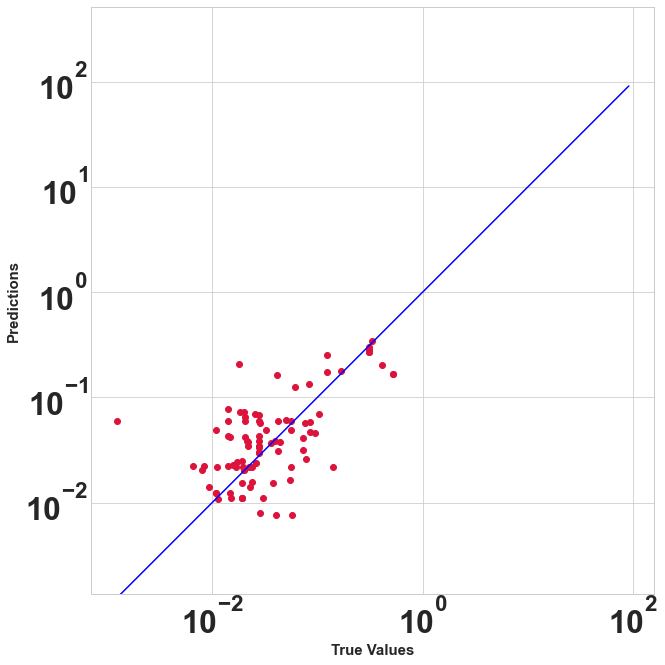

In [75]:
XGBscores,XGBpredictions= xgb_regression_nCV(predictors_s1, target_s1, inner_cv, outer_cv)

In [76]:
XGBscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'max_depth': 142, 'min_child_weight': 7, 'learning_rate': 0.326458128610753, 'subsample': 0.6692714411596589, 'colsample_bytree': 0.7780366217875353, 'n_estimators': 197, 'gamma': 0.07698066023214192, 'reg_alpha': 0.43052743975422103, 'reg_lambda': 0.013348056063205826}",4392.625681,0.060367,0.028835,0.626613
1,"{'max_depth': 103, 'min_child_weight': 5, 'learning_rate': 0.25889067365401786, 'subsample': 0.9617239903757936, 'colsample_bytree': 0.7138294866591943, 'n_estimators': 94, 'gamma': 0.028546155783582623, 'reg_alpha': 0.4614256127200243, 'reg_lambda': 0.29884601127346944}",67.990649,0.045887,0.027625,0.737836
2,"{'max_depth': 76, 'min_child_weight': 5, 'learning_rate': 0.36469940043975446, 'subsample': 0.942202852797177, 'colsample_bytree': 0.626358786768989, 'n_estimators': 186, 'gamma': 0.06065925070430468, 'reg_alpha': 0.06325763724629213, 'reg_lambda': 0.7601484503268218}",106.467241,0.10339,0.047648,0.257989
3,"{'max_depth': 88, 'min_child_weight': 4, 'learning_rate': 0.11309151630252684, 'subsample': 0.7679514162060147, 'colsample_bytree': 0.7379068365995561, 'n_estimators': 92, 'gamma': 0.019195641607591844, 'reg_alpha': 0.1976155920944203, 'reg_lambda': 0.9424031688817737}",68.462061,0.097162,0.042283,0.463865
4,"{'max_depth': 87, 'min_child_weight': 8, 'learning_rate': 0.4663249506792162, 'subsample': 0.9327641519038399, 'colsample_bytree': 0.2423860984965274, 'n_estimators': 183, 'gamma': 0.010034181808358425, 'reg_alpha': 0.5968746747382291, 'reg_lambda': 0.09899049265131143}",106.939736,0.069096,0.03518,0.562438


In [77]:
XGBscores.mean(axis=0)

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\4144725191.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Average tuning time    948.497074
RMSE                     0.075181
MAE                      0.036314
R2                       0.529748
dtype: float64

In [78]:
def objective_XGB(trial):
    param = {
                'max_depth': trial.suggest_int('max_depth', 2, 200),
                'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                # to control the complexity of the trees. 
                # tune these two together in order to find a good trade-off between model bias and variance
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                # to control the learning rates
                'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                # to control the sampling of the dataset that is done at each boosting round.
                # Instead of using the whole training set every time, we can build a tree on slightly different data at each step, 
                # which makes it less likely to overfit to a single sample or feature.
                'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                'gamma': trial.suggest_float('gamma', 0.01, 1.0),
                'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0)
                        }
    model = XGBRegressor(**param)
    model.fit(predictors_s1, target_s1)
    return abs(np.mean(cross_val_score(model, predictors_s1, target_s1, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
XGBstudy = optuna.create_study(direction='minimize', study_name='regression')
XGBstudy.optimize(objective_XGB, n_trials=100)
optuna.visualization.plot_optimization_history(XGBstudy)
#optuna.visualization.plot_param_importances(LGBMstudy)

[I 2023-01-09 09:51:02,280] A new study created in memory with name: regression
[I 2023-01-09 09:51:02,643] Trial 0 finished with value: 0.1008525781820394 and parameters: {'max_depth': 129, 'min_child_weight': 9, 'learning_rate': 0.23412231739443756, 'subsample': 0.25710162053092844, 'colsample_bytree': 0.29930664574928206, 'n_estimators': 61, 'gamma': 0.40246990137268096, 'reg_alpha': 0.26365028604612156, 'reg_lambda': 0.6591967282710796}. Best is trial 0 with value: 0.1008525781820394.
[I 2023-01-09 09:51:03,631] Trial 1 finished with value: 0.09739869826847486 and parameters: {'max_depth': 8, 'min_child_weight': 1, 'learning_rate': 0.48443409462454334, 'subsample': 0.47020871675900777, 'colsample_bytree': 0.45103054387450003, 'n_estimators': 147, 'gamma': 0.6380919321165012, 'reg_alpha': 0.5670857886416629, 'reg_lambda': 0.3030098324681767}. Best is trial 1 with value: 0.09739869826847486.
[I 2023-01-09 09:51:04,411] Trial 2 finished with value: 0.0941660314126881 and parameters: {

[I 2023-01-09 09:51:17,671] Trial 19 finished with value: 0.10057054310224678 and parameters: {'max_depth': 90, 'min_child_weight': 4, 'learning_rate': 0.7316925441166119, 'subsample': 0.587998679849511, 'colsample_bytree': 0.8895243667399388, 'n_estimators': 51, 'gamma': 0.8449783402336174, 'reg_alpha': 0.5465722015255566, 'reg_lambda': 0.12036074004436964}. Best is trial 12 with value: 0.07327947745521542.
[I 2023-01-09 09:51:18,773] Trial 20 finished with value: 0.09681674427291585 and parameters: {'max_depth': 200, 'min_child_weight': 2, 'learning_rate': 0.3787370717081095, 'subsample': 0.783039215392813, 'colsample_bytree': 0.7984053793904866, 'n_estimators': 131, 'gamma': 0.5595575996826295, 'reg_alpha': 0.39228784939657685, 'reg_lambda': 0.9650542730786685}. Best is trial 12 with value: 0.07327947745521542.
[I 2023-01-09 09:51:19,557] Trial 21 finished with value: 0.07281158015170926 and parameters: {'max_depth': 164, 'min_child_weight': 3, 'learning_rate': 0.26354120659911096, 

[I 2023-01-09 09:51:34,192] Trial 39 finished with value: 0.08502469405827817 and parameters: {'max_depth': 144, 'min_child_weight': 4, 'learning_rate': 0.5237102098292267, 'subsample': 0.8615756910789094, 'colsample_bytree': 0.45854455720474163, 'n_estimators': 112, 'gamma': 0.2708544910147199, 'reg_alpha': 0.5194033073520756, 'reg_lambda': 0.326709848452276}. Best is trial 31 with value: 0.07244424687999046.
[I 2023-01-09 09:51:35,435] Trial 40 finished with value: 0.09634053358878536 and parameters: {'max_depth': 110, 'min_child_weight': 5, 'learning_rate': 0.17365053368480016, 'subsample': 0.7306860450206956, 'colsample_bytree': 0.8306235146631376, 'n_estimators': 167, 'gamma': 0.5490546332295052, 'reg_alpha': 0.6285944372830932, 'reg_lambda': 0.4052270477808074}. Best is trial 31 with value: 0.07244424687999046.
[I 2023-01-09 09:51:36,312] Trial 41 finished with value: 0.07609685652256282 and parameters: {'max_depth': 160, 'min_child_weight': 2, 'learning_rate': 0.2798941560032067

[I 2023-01-09 09:51:52,386] Trial 59 finished with value: 0.0784063613511838 and parameters: {'max_depth': 114, 'min_child_weight': 1, 'learning_rate': 0.392030697362157, 'subsample': 0.9638715387914911, 'colsample_bytree': 0.6363426277026349, 'n_estimators': 117, 'gamma': 0.0889448864425314, 'reg_alpha': 0.3729131405372656, 'reg_lambda': 0.16396212085523357}. Best is trial 52 with value: 0.06951627274455754.
[I 2023-01-09 09:51:53,511] Trial 60 finished with value: 0.07204485205367665 and parameters: {'max_depth': 168, 'min_child_weight': 3, 'learning_rate': 0.32879881570174463, 'subsample': 0.8755335597036147, 'colsample_bytree': 0.6952947941355865, 'n_estimators': 136, 'gamma': 0.011432769152664935, 'reg_alpha': 0.54635598594397, 'reg_lambda': 0.28397564407469905}. Best is trial 52 with value: 0.06951627274455754.
[I 2023-01-09 09:51:54,599] Trial 61 finished with value: 0.0729547081482778 and parameters: {'max_depth': 166, 'min_child_weight': 3, 'learning_rate': 0.3283823899417331,

[I 2023-01-09 09:52:13,213] Trial 79 finished with value: 0.09483249508675418 and parameters: {'max_depth': 20, 'min_child_weight': 5, 'learning_rate': 0.8451396659281639, 'subsample': 0.9228647766897602, 'colsample_bytree': 0.5311416175315353, 'n_estimators': 192, 'gamma': 0.47742848465519294, 'reg_alpha': 0.9551389905159138, 'reg_lambda': 0.10437068117328857}. Best is trial 52 with value: 0.06951627274455754.
[I 2023-01-09 09:52:14,562] Trial 80 finished with value: 0.07694999282394786 and parameters: {'max_depth': 7, 'min_child_weight': 7, 'learning_rate': 0.3046576056135362, 'subsample': 0.9435085084334145, 'colsample_bytree': 0.7573477420761869, 'n_estimators': 186, 'gamma': 0.1058293008053628, 'reg_alpha': 0.49457501039468865, 'reg_lambda': 0.1404728318342766}. Best is trial 52 with value: 0.06951627274455754.
[I 2023-01-09 09:52:15,844] Trial 81 finished with value: 0.07240561034592913 and parameters: {'max_depth': 39, 'min_child_weight': 5, 'learning_rate': 0.22308278881789617,

[I 2023-01-09 09:52:35,213] Trial 99 finished with value: 0.07330122060596009 and parameters: {'max_depth': 152, 'min_child_weight': 5, 'learning_rate': 0.19892013057798902, 'subsample': 0.8996658621935292, 'colsample_bytree': 0.6173929822437367, 'n_estimators': 117, 'gamma': 0.05199946351988799, 'reg_alpha': 0.4968146219018662, 'reg_lambda': 0.29041115654487687}. Best is trial 52 with value: 0.06951627274455754.


### LGBM Regressor 

* automated tuning with optuna (Bayesian optimization)

In [79]:
def lgbm_regression_nCV(features, target, inner_cv, outer_cv):
    # Define optuna search for model tuning on the inner_cv
    def lgbm_optuna_tuning(Xtrain, ytrain):
        def objective_LGBM(trial):
                param = {
                    'max_depth': trial.suggest_int('max_depth', 2, 200),
                    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                    'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                    'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                    'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                    'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
                        }
                model = LGBMRegressor(**param)
                model.fit(Xtrain, ytrain)
                return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        LGBMstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        LGBMstudy.optimize(objective_LGBM, n_trials=100)
        LGBM_tuning_time = time.time() - start_time
        LGBMBest_params = LGBMstudy.best_params
        LGBMBest_score = LGBMstudy.best_value
        return LGBM_tuning_time, LGBMBest_params, LGBMBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(predictors_s1, target_s1): 
        Xtrain, ytrain = predictors_s1.iloc[train_index], target_s1.iloc[train_index]
        Xtest, ytest = predictors_s1.iloc[test_index], target_s1.iloc[test_index]
        LGBMAvg_tuning_time, LGBMBest_estimators, LGBMBest_score =  lgbm_optuna_tuning(Xtrain, ytrain)
        best_lgbm_model = LGBMRegressor().set_params(**LGBMBest_estimators)
        fitted_model = best_lgbm_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(LGBMAvg_tuning_time)
        estimators.append(LGBMBest_estimators)
        # show evaluation metric values
    LGBMscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    LGBMpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, LGBMpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(LGBMpredictions), max(ytest))
    p2 = min(min(LGBMpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return LGBMscores.T,LGBMpredictions.T

[I 2023-01-09 09:52:35,299] A new study created in memory with name: regression
[I 2023-01-09 09:52:35,443] Trial 0 finished with value: 0.08117495544114758 and parameters: {'max_depth': 162, 'min_child_weight': 4, 'learning_rate': 0.22997555406941614, 'n_estimators': 76, 'subsample': 0.7182520604193207, 'colsample_bytree': 0.4233761674498579, 'reg_alpha': 0.11121883635782956, 'reg_lambda': 0.29622829193478845}. Best is trial 0 with value: 0.08117495544114758.
[I 2023-01-09 09:52:35,564] Trial 1 finished with value: 0.08672846783368636 and parameters: {'max_depth': 24, 'min_child_weight': 9, 'learning_rate': 0.04098975746042606, 'n_estimators': 77, 'subsample': 0.6495240769859294, 'colsample_bytree': 0.9259167492934776, 'reg_alpha': 0.3707268758906308, 'reg_lambda': 0.6492274539103008}. Best is trial 0 with value: 0.08117495544114758.
[I 2023-01-09 09:52:35,657] Trial 2 finished with value: 0.08600719460128992 and parameters: {'max_depth': 150, 'min_child_weight': 4, 'learning_rate': 0

[I 2023-01-09 09:52:38,378] Trial 21 finished with value: 0.08273349729246196 and parameters: {'max_depth': 100, 'min_child_weight': 4, 'learning_rate': 0.3373353979629635, 'n_estimators': 50, 'subsample': 0.41484293894235547, 'colsample_bytree': 0.3956739889485323, 'reg_alpha': 0.2060532096707961, 'reg_lambda': 0.2670959712393073}. Best is trial 0 with value: 0.08117495544114758.
[I 2023-01-09 09:52:38,549] Trial 22 finished with value: 0.08640974819040848 and parameters: {'max_depth': 135, 'min_child_weight': 2, 'learning_rate': 0.5259991824802916, 'n_estimators': 164, 'subsample': 0.6810288982388223, 'colsample_bytree': 0.261217883776219, 'reg_alpha': 0.2492515963685049, 'reg_lambda': 0.15949853911325065}. Best is trial 0 with value: 0.08117495544114758.
[I 2023-01-09 09:52:38,749] Trial 23 finished with value: 0.08113588406047582 and parameters: {'max_depth': 87, 'min_child_weight': 5, 'learning_rate': 0.3955610917966782, 'n_estimators': 91, 'subsample': 0.8949128333594812, 'colsam

[I 2023-01-09 09:52:41,734] Trial 42 finished with value: 0.09324578900156404 and parameters: {'max_depth': 170, 'min_child_weight': 2, 'learning_rate': 0.11147429559775972, 'n_estimators': 50, 'subsample': 0.18655844556985296, 'colsample_bytree': 0.048428789667461725, 'reg_alpha': 0.21370840791111334, 'reg_lambda': 0.10940405217139168}. Best is trial 23 with value: 0.08113588406047582.
[I 2023-01-09 09:52:41,970] Trial 43 finished with value: 0.08315960696778876 and parameters: {'max_depth': 127, 'min_child_weight': 4, 'learning_rate': 0.20826482673389973, 'n_estimators': 97, 'subsample': 0.07674987147208989, 'colsample_bytree': 0.19809412557762907, 'reg_alpha': 0.061547074732370005, 'reg_lambda': 0.24024617613501079}. Best is trial 23 with value: 0.08113588406047582.
[I 2023-01-09 09:52:42,167] Trial 44 finished with value: 0.08414954820983095 and parameters: {'max_depth': 163, 'min_child_weight': 1, 'learning_rate': 0.1989408983421935, 'n_estimators': 108, 'subsample': 0.24421710585

[I 2023-01-09 09:52:46,184] Trial 63 finished with value: 0.0806898462443848 and parameters: {'max_depth': 17, 'min_child_weight': 10, 'learning_rate': 0.10915245638320566, 'n_estimators': 122, 'subsample': 0.7809762936429953, 'colsample_bytree': 0.8547751969426749, 'reg_alpha': 0.07301232233667546, 'reg_lambda': 0.4789296984478968}. Best is trial 56 with value: 0.0799045500116104.
[I 2023-01-09 09:52:46,469] Trial 64 finished with value: 0.08177293357698984 and parameters: {'max_depth': 14, 'min_child_weight': 10, 'learning_rate': 0.13076375613547603, 'n_estimators': 131, 'subsample': 0.7655911380463414, 'colsample_bytree': 0.8413846145673902, 'reg_alpha': 0.07317705705465676, 'reg_lambda': 0.47780302785712486}. Best is trial 56 with value: 0.0799045500116104.
[I 2023-01-09 09:52:46,702] Trial 65 finished with value: 0.08168976822242055 and parameters: {'max_depth': 17, 'min_child_weight': 10, 'learning_rate': 0.06004246416600678, 'n_estimators': 122, 'subsample': 0.7097030887904014, 

[I 2023-01-09 09:52:50,965] Trial 84 finished with value: 0.08406497024753208 and parameters: {'max_depth': 26, 'min_child_weight': 9, 'learning_rate': 0.04351018218550462, 'n_estimators': 121, 'subsample': 0.6539401237966052, 'colsample_bytree': 0.8140832131177691, 'reg_alpha': 0.12278810484692168, 'reg_lambda': 0.7858640440543021}. Best is trial 76 with value: 0.07984048796959999.
[I 2023-01-09 09:52:51,260] Trial 85 finished with value: 0.08114018329361261 and parameters: {'max_depth': 19, 'min_child_weight': 10, 'learning_rate': 0.12890758717493098, 'n_estimators': 127, 'subsample': 0.8459071966685051, 'colsample_bytree': 0.9446686748262046, 'reg_alpha': 0.01351246609330968, 'reg_lambda': 0.6296236418680302}. Best is trial 76 with value: 0.07984048796959999.
[I 2023-01-09 09:52:51,514] Trial 86 finished with value: 0.0809349798986364 and parameters: {'max_depth': 43, 'min_child_weight': 10, 'learning_rate': 0.2181534946426619, 'n_estimators': 113, 'subsample': 0.8097577786022723, '

[I 2023-01-09 09:52:55,371] Trial 5 finished with value: 0.08892925762748811 and parameters: {'max_depth': 154, 'min_child_weight': 6, 'learning_rate': 0.8153044030803198, 'n_estimators': 144, 'subsample': 0.024532700520028553, 'colsample_bytree': 0.3975098188191929, 'reg_alpha': 0.35503267830854135, 'reg_lambda': 0.14514258383862969}. Best is trial 3 with value: 0.08048256895244106.
[I 2023-01-09 09:52:55,505] Trial 6 finished with value: 0.08328285461593603 and parameters: {'max_depth': 98, 'min_child_weight': 4, 'learning_rate': 0.24412016442727855, 'n_estimators': 191, 'subsample': 0.9877675342855776, 'colsample_bytree': 0.6566967237717494, 'reg_alpha': 0.4833221919345444, 'reg_lambda': 0.6233158382202851}. Best is trial 3 with value: 0.08048256895244106.
[I 2023-01-09 09:52:55,615] Trial 7 finished with value: 0.0919423341099776 and parameters: {'max_depth': 40, 'min_child_weight': 4, 'learning_rate': 0.8766955451328634, 'n_estimators': 161, 'subsample': 0.7517042123415414, 'colsa

[I 2023-01-09 09:52:59,410] Trial 26 finished with value: 0.08084050173391612 and parameters: {'max_depth': 123, 'min_child_weight': 3, 'learning_rate': 0.2523166728702139, 'n_estimators': 100, 'subsample': 0.48929911855865327, 'colsample_bytree': 0.675391135717602, 'reg_alpha': 0.10846183387627258, 'reg_lambda': 0.6794481127121691}. Best is trial 11 with value: 0.08008907550251956.
[I 2023-01-09 09:52:59,590] Trial 27 finished with value: 0.08171129962161179 and parameters: {'max_depth': 111, 'min_child_weight': 2, 'learning_rate': 0.33595170044559874, 'n_estimators': 80, 'subsample': 0.2940002606676372, 'colsample_bytree': 0.5028858758002792, 'reg_alpha': 0.23574499764953305, 'reg_lambda': 0.8149445037140203}. Best is trial 11 with value: 0.08008907550251956.
[I 2023-01-09 09:52:59,730] Trial 28 finished with value: 0.08738811256306749 and parameters: {'max_depth': 143, 'min_child_weight': 1, 'learning_rate': 0.5567984930574347, 'n_estimators': 57, 'subsample': 0.3844565322778112, 'c

[I 2023-01-09 09:53:03,054] Trial 47 finished with value: 0.07957903891666751 and parameters: {'max_depth': 132, 'min_child_weight': 4, 'learning_rate': 0.16783219244757056, 'n_estimators': 103, 'subsample': 0.5205283945218063, 'colsample_bytree': 0.5649042300100312, 'reg_alpha': 0.10678693848719109, 'reg_lambda': 0.514708473280158}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:03,253] Trial 48 finished with value: 0.0843886256947005 and parameters: {'max_depth': 132, 'min_child_weight': 4, 'learning_rate': 0.5067923151626966, 'n_estimators': 140, 'subsample': 0.6296129830937578, 'colsample_bytree': 0.40128693412842675, 'reg_alpha': 0.12856375475930426, 'reg_lambda': 0.4106770663596362}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:03,462] Trial 49 finished with value: 0.0817443456875838 and parameters: {'max_depth': 173, 'min_child_weight': 4, 'learning_rate': 0.14620877069038468, 'n_estimators': 120, 'subsample': 0.7184634983870882, '

[I 2023-01-09 09:53:07,308] Trial 68 finished with value: 0.08509082153312034 and parameters: {'max_depth': 108, 'min_child_weight': 1, 'learning_rate': 0.07064030997415899, 'n_estimators': 108, 'subsample': 0.523872425445033, 'colsample_bytree': 0.5117776678195863, 'reg_alpha': 0.8379389282577793, 'reg_lambda': 0.49506074238475645}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:07,489] Trial 69 finished with value: 0.08580084518376477 and parameters: {'max_depth': 116, 'min_child_weight': 2, 'learning_rate': 0.22818723938354252, 'n_estimators': 115, 'subsample': 0.4664904567045061, 'colsample_bytree': 0.13735987377357067, 'reg_alpha': 0.17860326107666982, 'reg_lambda': 0.7821545065835762}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:07,669] Trial 70 finished with value: 0.08158136258429145 and parameters: {'max_depth': 48, 'min_child_weight': 6, 'learning_rate': 0.12517418426423407, 'n_estimators': 76, 'subsample': 0.2655631724002463, 

[I 2023-01-09 09:53:11,877] Trial 89 finished with value: 0.08104775609213113 and parameters: {'max_depth': 99, 'min_child_weight': 8, 'learning_rate': 0.23312988034373805, 'n_estimators': 92, 'subsample': 0.6596507190572114, 'colsample_bytree': 0.6302819479336279, 'reg_alpha': 0.06357388122240201, 'reg_lambda': 0.07347443516915898}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:12,097] Trial 90 finished with value: 0.08390275563003624 and parameters: {'max_depth': 71, 'min_child_weight': 10, 'learning_rate': 0.39034831179163554, 'n_estimators': 105, 'subsample': 0.5962180861018698, 'colsample_bytree': 0.5287208171692284, 'reg_alpha': 0.010883713157954965, 'reg_lambda': 0.1968400944107095}. Best is trial 41 with value: 0.07887276492483482.
[I 2023-01-09 09:53:12,325] Trial 91 finished with value: 0.08069167941244562 and parameters: {'max_depth': 120, 'min_child_weight': 3, 'learning_rate': 0.2543495716832466, 'n_estimators': 123, 'subsample': 0.5128977266049936,

[I 2023-01-09 09:53:15,516] Trial 10 finished with value: 0.07023641022815272 and parameters: {'max_depth': 75, 'min_child_weight': 1, 'learning_rate': 0.4871815081364214, 'n_estimators': 103, 'subsample': 0.08197179999281684, 'colsample_bytree': 0.24845466194354004, 'reg_alpha': 0.23230564073635196, 'reg_lambda': 0.25224653421848636}. Best is trial 8 with value: 0.06815006130773461.
[I 2023-01-09 09:53:15,704] Trial 11 finished with value: 0.07003123777325937 and parameters: {'max_depth': 73, 'min_child_weight': 1, 'learning_rate': 0.47677592093492943, 'n_estimators': 107, 'subsample': 0.11437813104501837, 'colsample_bytree': 0.2591573721202328, 'reg_alpha': 0.23146199148073754, 'reg_lambda': 0.24888193611274506}. Best is trial 8 with value: 0.06815006130773461.
[I 2023-01-09 09:53:15,898] Trial 12 finished with value: 0.06944334728849778 and parameters: {'max_depth': 55, 'min_child_weight': 2, 'learning_rate': 0.2627978023157553, 'n_estimators': 162, 'subsample': 0.02422801014759668,

[I 2023-01-09 09:53:20,624] Trial 31 finished with value: 0.0661991704118482 and parameters: {'max_depth': 85, 'min_child_weight': 8, 'learning_rate': 0.40170751025061907, 'n_estimators': 172, 'subsample': 0.24450650177062144, 'colsample_bytree': 0.6549579006904865, 'reg_alpha': 0.07194044821427571, 'reg_lambda': 0.8115076259144931}. Best is trial 26 with value: 0.06381734978301003.
[I 2023-01-09 09:53:20,816] Trial 32 finished with value: 0.0691286912370575 and parameters: {'max_depth': 81, 'min_child_weight': 8, 'learning_rate': 0.3107093631899419, 'n_estimators': 156, 'subsample': 0.3361777107089318, 'colsample_bytree': 0.5314325003054947, 'reg_alpha': 0.1864250965680664, 'reg_lambda': 0.5946413309598734}. Best is trial 26 with value: 0.06381734978301003.
[I 2023-01-09 09:53:21,095] Trial 33 finished with value: 0.06378775682151441 and parameters: {'max_depth': 67, 'min_child_weight': 9, 'learning_rate': 0.19203343434763387, 'n_estimators': 185, 'subsample': 0.7225999174920971, 'col

[I 2023-01-09 09:53:26,066] Trial 52 finished with value: 0.06425147111634398 and parameters: {'max_depth': 21, 'min_child_weight': 10, 'learning_rate': 0.18767354463904057, 'n_estimators': 184, 'subsample': 0.6970038132520889, 'colsample_bytree': 0.4261173169646668, 'reg_alpha': 0.10145358293800465, 'reg_lambda': 0.7203102874666062}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:26,285] Trial 53 finished with value: 0.0681740442383338 and parameters: {'max_depth': 8, 'min_child_weight': 9, 'learning_rate': 0.7055456934025082, 'n_estimators': 194, 'subsample': 0.8077853953843471, 'colsample_bytree': 0.5697533688368644, 'reg_alpha': 0.04147797349727496, 'reg_lambda': 0.6509025338349839}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:26,538] Trial 54 finished with value: 0.06663150853203069 and parameters: {'max_depth': 52, 'min_child_weight': 10, 'learning_rate': 0.33303845187378833, 'n_estimators': 168, 'subsample': 0.7477259214931837, 

[I 2023-01-09 09:53:32,158] Trial 73 finished with value: 0.0655637805764882 and parameters: {'max_depth': 28, 'min_child_weight': 8, 'learning_rate': 0.20180195780028048, 'n_estimators': 121, 'subsample': 0.7872177682405435, 'colsample_bytree': 0.6609334398100343, 'reg_alpha': 0.12057460718384842, 'reg_lambda': 0.8271726117098599}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:32,491] Trial 74 finished with value: 0.0644605507580369 and parameters: {'max_depth': 98, 'min_child_weight': 10, 'learning_rate': 0.31972083404628904, 'n_estimators': 182, 'subsample': 0.4342142148812159, 'colsample_bytree': 0.39171399620404385, 'reg_alpha': 0.08338033722033594, 'reg_lambda': 0.7311749427797011}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:32,908] Trial 75 finished with value: 0.06404198164476656 and parameters: {'max_depth': 40, 'min_child_weight': 9, 'learning_rate': 0.2344706654007065, 'n_estimators': 197, 'subsample': 0.628563018361664, '

[I 2023-01-09 09:53:37,947] Trial 94 finished with value: 0.06333468762581113 and parameters: {'max_depth': 64, 'min_child_weight': 8, 'learning_rate': 0.2472311342743419, 'n_estimators': 177, 'subsample': 0.3949754163336028, 'colsample_bytree': 0.5901367801163586, 'reg_alpha': 0.05219765798731947, 'reg_lambda': 0.10886845163754079}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:38,224] Trial 95 finished with value: 0.06484180140388962 and parameters: {'max_depth': 55, 'min_child_weight': 7, 'learning_rate': 0.24445193510526286, 'n_estimators': 176, 'subsample': 0.41374465806520566, 'colsample_bytree': 0.5012339816328222, 'reg_alpha': 0.05563838544905439, 'reg_lambda': 0.14784301185935592}. Best is trial 34 with value: 0.062063735096579725.
[I 2023-01-09 09:53:38,509] Trial 96 finished with value: 0.06280358211759779 and parameters: {'max_depth': 66, 'min_child_weight': 8, 'learning_rate': 0.2122548244476028, 'n_estimators': 185, 'subsample': 0.2983315053029396

[I 2023-01-09 09:53:41,905] Trial 15 finished with value: 0.07544996927264783 and parameters: {'max_depth': 14, 'min_child_weight': 9, 'learning_rate': 0.1717768144683891, 'n_estimators': 161, 'subsample': 0.5747524452085107, 'colsample_bytree': 0.6368421902754573, 'reg_alpha': 0.3657342308480981, 'reg_lambda': 0.6680011536686297}. Best is trial 14 with value: 0.07463527571923452.
[I 2023-01-09 09:53:42,049] Trial 16 finished with value: 0.08241830301910069 and parameters: {'max_depth': 17, 'min_child_weight': 8, 'learning_rate': 0.02469885375453873, 'n_estimators': 75, 'subsample': 0.5549800732642649, 'colsample_bytree': 0.6957343588845665, 'reg_alpha': 0.46442417609580383, 'reg_lambda': 0.6250073988864281}. Best is trial 14 with value: 0.07463527571923452.
[I 2023-01-09 09:53:42,252] Trial 17 finished with value: 0.0758835575093913 and parameters: {'max_depth': 5, 'min_child_weight': 5, 'learning_rate': 0.15153425671720017, 'n_estimators': 128, 'subsample': 0.5514151058715303, 'colsa

[I 2023-01-09 09:53:46,273] Trial 36 finished with value: 0.07706846403998006 and parameters: {'max_depth': 145, 'min_child_weight': 10, 'learning_rate': 0.04232299594184008, 'n_estimators': 84, 'subsample': 0.08982105489170153, 'colsample_bytree': 0.3793423836855029, 'reg_alpha': 0.06941195835753539, 'reg_lambda': 0.4181255209680143}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:46,527] Trial 37 finished with value: 0.07320418844898534 and parameters: {'max_depth': 95, 'min_child_weight': 10, 'learning_rate': 0.12161445358188444, 'n_estimators': 104, 'subsample': 0.14555369594439654, 'colsample_bytree': 0.7034368491572378, 'reg_alpha': 0.07962872021098548, 'reg_lambda': 0.14386518369989726}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:46,691] Trial 38 finished with value: 0.07559801848272542 and parameters: {'max_depth': 88, 'min_child_weight': 10, 'learning_rate': 0.12309153838972307, 'n_estimators': 52, 'subsample': 0.05217690693906

[I 2023-01-09 09:53:50,760] Trial 57 finished with value: 0.07277990556883826 and parameters: {'max_depth': 190, 'min_child_weight': 9, 'learning_rate': 0.1809887615752928, 'n_estimators': 141, 'subsample': 0.7317246795460788, 'colsample_bytree': 0.3628765516506195, 'reg_alpha': 0.018389943190124602, 'reg_lambda': 0.7064796683618377}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:50,987] Trial 58 finished with value: 0.07351685680941397 and parameters: {'max_depth': 150, 'min_child_weight': 9, 'learning_rate': 0.18207017806063489, 'n_estimators': 140, 'subsample': 0.740293424176193, 'colsample_bytree': 0.4627612316542791, 'reg_alpha': 0.1615800872099284, 'reg_lambda': 0.8229867733001414}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:51,174] Trial 59 finished with value: 0.07379218868136372 and parameters: {'max_depth': 193, 'min_child_weight': 8, 'learning_rate': 0.2917562374384742, 'n_estimators': 144, 'subsample': 0.8735347223080672, '

[I 2023-01-09 09:53:55,563] Trial 78 finished with value: 0.07723008450440333 and parameters: {'max_depth': 113, 'min_child_weight': 8, 'learning_rate': 0.16465577646938656, 'n_estimators': 132, 'subsample': 0.8936552922286423, 'colsample_bytree': 0.4424889553626168, 'reg_alpha': 0.8337713111258025, 'reg_lambda': 0.7229372697902061}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:55,793] Trial 79 finished with value: 0.07316020689877674 and parameters: {'max_depth': 138, 'min_child_weight': 9, 'learning_rate': 0.2230948155752281, 'n_estimators': 124, 'subsample': 0.2231680993286882, 'colsample_bytree': 0.6036102896553899, 'reg_alpha': 0.08415476050383501, 'reg_lambda': 0.6184412203303059}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:53:56,009] Trial 80 finished with value: 0.07313241576447214 and parameters: {'max_depth': 88, 'min_child_weight': 10, 'learning_rate': 0.1341323753474028, 'n_estimators': 117, 'subsample': 0.9704375486495536, '

[I 2023-01-09 09:54:00,084] Trial 99 finished with value: 0.07379310691890778 and parameters: {'max_depth': 186, 'min_child_weight': 10, 'learning_rate': 0.1502276185902872, 'n_estimators': 125, 'subsample': 0.05692716468052949, 'colsample_bytree': 0.5130367640811166, 'reg_alpha': 0.19121929328226767, 'reg_lambda': 0.7499665766270722}. Best is trial 32 with value: 0.07198799122024196.
[I 2023-01-09 09:54:00,133] A new study created in memory with name: regression
[I 2023-01-09 09:54:00,202] Trial 0 finished with value: 0.08978737071447454 and parameters: {'max_depth': 64, 'min_child_weight': 9, 'learning_rate': 0.9956257102104231, 'n_estimators': 55, 'subsample': 0.5181803969920225, 'colsample_bytree': 0.9526653746097798, 'reg_alpha': 0.985951274417386, 'reg_lambda': 0.6235673254698645}. Best is trial 0 with value: 0.08978737071447454.
[I 2023-01-09 09:54:00,271] Trial 1 finished with value: 0.09079223831822299 and parameters: {'max_depth': 166, 'min_child_weight': 10, 'learning_rate':

[I 2023-01-09 09:54:02,834] Trial 20 finished with value: 0.0838676683798346 and parameters: {'max_depth': 93, 'min_child_weight': 5, 'learning_rate': 0.31090236257155013, 'n_estimators': 187, 'subsample': 0.3069993381127023, 'colsample_bytree': 0.4212690523216663, 'reg_alpha': 0.6436537042294534, 'reg_lambda': 0.23678041370375918}. Best is trial 4 with value: 0.08303891317503106.
[I 2023-01-09 09:54:03,009] Trial 21 finished with value: 0.08353283408864948 and parameters: {'max_depth': 92, 'min_child_weight': 4, 'learning_rate': 0.2870306086750645, 'n_estimators': 186, 'subsample': 0.2713599877849504, 'colsample_bytree': 0.41349361924719075, 'reg_alpha': 0.6379273613708656, 'reg_lambda': 0.24312599549704594}. Best is trial 4 with value: 0.08303891317503106.
[I 2023-01-09 09:54:03,164] Trial 22 finished with value: 0.08675824782463443 and parameters: {'max_depth': 96, 'min_child_weight': 5, 'learning_rate': 0.3817082073708213, 'n_estimators': 181, 'subsample': 0.3168080538839945, 'cols

[I 2023-01-09 09:54:05,992] Trial 41 finished with value: 0.08456567547115905 and parameters: {'max_depth': 70, 'min_child_weight': 6, 'learning_rate': 0.4156356091612018, 'n_estimators': 167, 'subsample': 0.4658092067995472, 'colsample_bytree': 0.39601137616546805, 'reg_alpha': 0.748096391546099, 'reg_lambda': 0.06630189739448628}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:06,115] Trial 42 finished with value: 0.08649491785373324 and parameters: {'max_depth': 82, 'min_child_weight': 10, 'learning_rate': 0.49388392514454704, 'n_estimators': 146, 'subsample': 0.33015886627188235, 'colsample_bytree': 0.48420521025311175, 'reg_alpha': 0.8189092371544657, 'reg_lambda': 0.11972894108851947}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:06,260] Trial 43 finished with value: 0.0846675702286459 and parameters: {'max_depth': 51, 'min_child_weight': 3, 'learning_rate': 0.20911176077218802, 'n_estimators': 156, 'subsample': 0.4186175771162086, 

[I 2023-01-09 09:54:09,194] Trial 62 finished with value: 0.08356318622160981 and parameters: {'max_depth': 155, 'min_child_weight': 6, 'learning_rate': 0.1369025023457254, 'n_estimators': 130, 'subsample': 0.6315587201657185, 'colsample_bytree': 0.6400024959362647, 'reg_alpha': 0.9557018345936951, 'reg_lambda': 0.13759999909718626}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:09,332] Trial 63 finished with value: 0.08327688406589796 and parameters: {'max_depth': 121, 'min_child_weight': 5, 'learning_rate': 0.13116848080204987, 'n_estimators': 131, 'subsample': 0.7653122420101295, 'colsample_bytree': 0.7503548745900847, 'reg_alpha': 0.9022334356166039, 'reg_lambda': 0.03615534603728751}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:09,501] Trial 64 finished with value: 0.08318704972999552 and parameters: {'max_depth': 146, 'min_child_weight': 5, 'learning_rate': 0.03761982806732313, 'n_estimators': 120, 'subsample': 0.8921117753315532,

[I 2023-01-09 09:54:12,338] Trial 83 finished with value: 0.08359535929675667 and parameters: {'max_depth': 191, 'min_child_weight': 4, 'learning_rate': 0.11707311694831342, 'n_estimators': 83, 'subsample': 0.8070345549531, 'colsample_bytree': 0.590611895482735, 'reg_alpha': 0.8407945269308174, 'reg_lambda': 0.012418376468308545}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:12,460] Trial 84 finished with value: 0.0838447672852689 and parameters: {'max_depth': 161, 'min_child_weight': 5, 'learning_rate': 0.25604557168621, 'n_estimators': 101, 'subsample': 0.9719837006111848, 'colsample_bytree': 0.6613757254270549, 'reg_alpha': 0.920419402811083, 'reg_lambda': 0.2003965000688387}. Best is trial 23 with value: 0.08268521735783009.
[I 2023-01-09 09:54:12,614] Trial 85 finished with value: 0.08362613051916327 and parameters: {'max_depth': 148, 'min_child_weight': 4, 'learning_rate': 0.10234435664543975, 'n_estimators': 153, 'subsample': 0.7599564906646645, 'colsamp

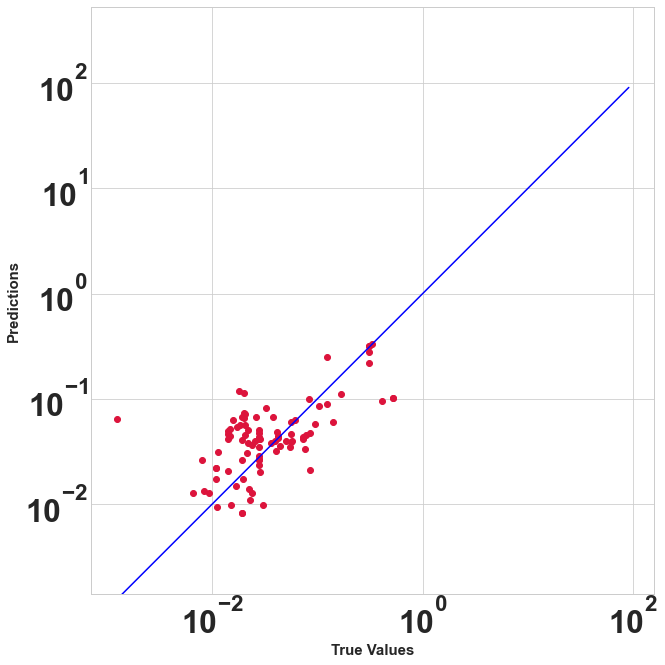

In [80]:
LGBMscores,LGBMpredictions = lgbm_regression_nCV(predictors_s1, target_s1, inner_cv, outer_cv)

In [81]:
LGBMscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'max_depth': 22, 'min_child_weight': 9, 'learning_rate': 0.16194242751010984, 'n_estimators': 109, 'subsample': 0.8423581544581691, 'colsample_bytree': 0.7434145474222836, 'reg_alpha': 0.07192095190081006, 'reg_lambda': 0.6111436824501036}",19.280174,0.053478,0.027835,0.706978
1,"{'max_depth': 150, 'min_child_weight': 1, 'learning_rate': 0.2411226576852262, 'n_estimators': 94, 'subsample': 0.4594239552749898, 'colsample_bytree': 0.781827115293081, 'reg_alpha': 0.06055142332023262, 'reg_lambda': 0.16104402760661984}",19.37611,0.038664,0.026307,0.813878
2,"{'max_depth': 65, 'min_child_weight': 10, 'learning_rate': 0.20031082477523302, 'n_estimators': 190, 'subsample': 0.7224825513385968, 'colsample_bytree': 0.4433470871473491, 'reg_alpha': 0.012209565387442833, 'reg_lambda': 0.6806452753810346}",25.1854,0.111345,0.046314,0.139417
3,"{'max_depth': 89, 'min_child_weight': 9, 'learning_rate': 0.1039849425786293, 'n_estimators': 135, 'subsample': 0.15990817824035622, 'colsample_bytree': 0.5061796363386444, 'reg_alpha': 0.06716647869907219, 'reg_lambda': 0.9000772093902287}",20.76688,0.096496,0.048337,0.471198
4,"{'max_depth': 95, 'min_child_weight': 4, 'learning_rate': 0.2569842966819229, 'n_estimators': 163, 'subsample': 0.26851015045081017, 'colsample_bytree': 0.7048188965520392, 'reg_alpha': 0.702827541381936, 'reg_lambda': 0.03346044473327378}",14.635858,0.077804,0.036071,0.445206


In [82]:
LGBMscores.mean(axis=0)

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\3836383310.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Average tuning time    19.848885
RMSE                    0.075557
MAE                     0.036973
R2                      0.515336
dtype: float64

In [83]:
def objective_LGBM(trial):
    param = {
                    'max_depth': trial.suggest_int('max_depth', 2, 200),
                    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                    'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                    'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                    'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                    'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
                        }
    model = LGBMRegressor(**param)
    model.fit(predictors_s1, target_s1)
    return abs(np.mean(cross_val_score(model, predictors_s1, target_s1, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
LGBMstudy = optuna.create_study(direction='minimize', study_name='regression')
LGBMstudy.optimize(objective_LGBM, n_trials=100)
optuna.visualization.plot_optimization_history(LGBMstudy)
#optuna.visualization.plot_param_importances(LGBMstudy)

[I 2023-01-09 09:54:15,256] A new study created in memory with name: regression
[I 2023-01-09 09:54:15,345] Trial 0 finished with value: 0.08271573659407469 and parameters: {'max_depth': 14, 'min_child_weight': 10, 'learning_rate': 0.9537009271668724, 'n_estimators': 96, 'subsample': 0.3542816875714338, 'colsample_bytree': 0.3781968028280678, 'reg_alpha': 0.764787871005512, 'reg_lambda': 0.6288428933313653}. Best is trial 0 with value: 0.08271573659407469.
[I 2023-01-09 09:54:15,418] Trial 1 finished with value: 0.08379831622032625 and parameters: {'max_depth': 36, 'min_child_weight': 10, 'learning_rate': 0.9684442243549577, 'n_estimators': 53, 'subsample': 0.5265647982921845, 'colsample_bytree': 0.29839938554468287, 'reg_alpha': 0.9933008661933342, 'reg_lambda': 0.3983846704185028}. Best is trial 0 with value: 0.08271573659407469.
[I 2023-01-09 09:54:15,655] Trial 2 finished with value: 0.07716641093292181 and parameters: {'max_depth': 117, 'min_child_weight': 9, 'learning_rate': 0.10

[I 2023-01-09 09:54:19,851] Trial 21 finished with value: 0.07387395350592901 and parameters: {'max_depth': 175, 'min_child_weight': 7, 'learning_rate': 0.23214780736932727, 'n_estimators': 159, 'subsample': 0.7184451622846569, 'colsample_bytree': 0.8485007564228679, 'reg_alpha': 0.03059583262112856, 'reg_lambda': 0.10141196948233423}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:20,129] Trial 22 finished with value: 0.07821263981872434 and parameters: {'max_depth': 187, 'min_child_weight': 9, 'learning_rate': 0.3520137069293795, 'n_estimators': 153, 'subsample': 0.6828702698851469, 'colsample_bytree': 0.7279299127856262, 'reg_alpha': 0.16775024512193634, 'reg_lambda': 0.017989631690209236}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:20,456] Trial 23 finished with value: 0.07502912967243737 and parameters: {'max_depth': 180, 'min_child_weight': 6, 'learning_rate': 0.227437708350137, 'n_estimators': 109, 'subsample': 0.5820419323263123

[I 2023-01-09 09:54:25,600] Trial 42 finished with value: 0.07814670549304614 and parameters: {'max_depth': 29, 'min_child_weight': 8, 'learning_rate': 0.39824549179206703, 'n_estimators': 148, 'subsample': 0.29784703965548703, 'colsample_bytree': 0.9746628204360162, 'reg_alpha': 0.010496341641324437, 'reg_lambda': 0.0839999786385605}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:25,882] Trial 43 finished with value: 0.07552876640183374 and parameters: {'max_depth': 50, 'min_child_weight': 7, 'learning_rate': 0.13335005045378195, 'n_estimators': 125, 'subsample': 0.21406145050566155, 'colsample_bytree': 0.9127706355331698, 'reg_alpha': 0.07013731462603007, 'reg_lambda': 0.07636694312068797}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:26,146] Trial 44 finished with value: 0.07592148682250226 and parameters: {'max_depth': 94, 'min_child_weight': 8, 'learning_rate': 0.21534410936789777, 'n_estimators': 123, 'subsample': 0.632212825491628

[I 2023-01-09 09:54:31,129] Trial 63 finished with value: 0.0774982017956009 and parameters: {'max_depth': 171, 'min_child_weight': 7, 'learning_rate': 0.27476068624500644, 'n_estimators': 142, 'subsample': 0.6159240402382795, 'colsample_bytree': 0.8656697745838093, 'reg_alpha': 0.012066864005245693, 'reg_lambda': 0.030325395584144495}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:31,419] Trial 64 finished with value: 0.07583937122967697 and parameters: {'max_depth': 32, 'min_child_weight': 9, 'learning_rate': 0.21387617544866824, 'n_estimators': 149, 'subsample': 0.4039732489326189, 'colsample_bytree': 0.8276362804406919, 'reg_alpha': 0.16309835278880305, 'reg_lambda': 0.12301836424476681}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:31,695] Trial 65 finished with value: 0.0770892204946594 and parameters: {'max_depth': 54, 'min_child_weight': 8, 'learning_rate': 0.05153506434981853, 'n_estimators': 121, 'subsample': 0.4962252813466510

[I 2023-01-09 09:54:37,246] Trial 84 finished with value: 0.07531014039409091 and parameters: {'max_depth': 44, 'min_child_weight': 8, 'learning_rate': 0.17688649841843054, 'n_estimators': 141, 'subsample': 0.5346049995111196, 'colsample_bytree': 0.65758057582612, 'reg_alpha': 0.1414168788100312, 'reg_lambda': 0.034533530925063054}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:37,515] Trial 85 finished with value: 0.07447909176721856 and parameters: {'max_depth': 55, 'min_child_weight': 8, 'learning_rate': 0.150080597491962, 'n_estimators': 119, 'subsample': 0.5912893145973166, 'colsample_bytree': 0.7399576455594412, 'reg_alpha': 0.0735049439710275, 'reg_lambda': 0.010631492621867078}. Best is trial 14 with value: 0.07381197939219111.
[I 2023-01-09 09:54:37,801] Trial 86 finished with value: 0.07433893728488014 and parameters: {'max_depth': 66, 'min_child_weight': 8, 'learning_rate': 0.1548101657996843, 'n_estimators': 121, 'subsample': 0.5856755769779604, 'col

# 3  Performance evaluation

* Observed performance before tuning:  XGBoost > LGBM > Ridge > LinearRegression > KNeighborsRegressor > SupportVectorRegressor
* Observed performance after optimizing:  XGBoost > LGBM > Ridge > LinearRegression > KNeighborsRegressor > SupportVectorRegressor
* Performances on test set vs on train set? -> draw conclusion on predictions power.
* Evaluate the key features that explain the model

In [84]:
metrics_mean_ = pd.DataFrame({'Baseline Linear Regression': LRscores.mean(axis=0)})
metrics_mean_['Ridge Regression'] = Riscores.mean(axis=0)
metrics_mean_['K-Nearest Neighbors Regressor'] = KNRscores.mean(axis=0)
metrics_mean_['eXtreme Gradient Boost'] = XGBscores.mean(axis=0)
metrics_mean_['Light Gradient Boost Machine'] = LGBMscores.mean(axis=0)
metrics_mean_

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\1711826407.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\1711826407.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\1711826407.py:3: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_40280\1711826407.py:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_

,Baseline Linear Regression,Ridge Regression,K-Nearest Neighbors Regressor,eXtreme Gradient Boost,Light Gradient Boost Machine
Average tuning time,0.104136,1.644158,6.345811,948.497074,19.848885
RMSE,0.089873,0.083601,0.099549,0.075181,0.075557
MAE,0.048413,0.042909,0.049985,0.036314,0.036973
R2,0.314904,0.416821,0.167414,0.529748,0.515336


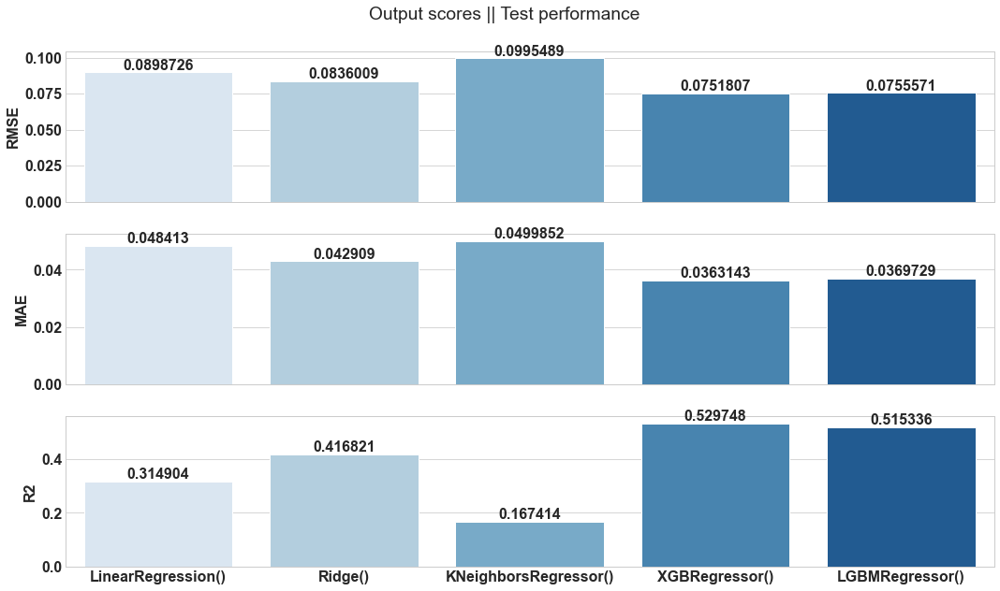

In [105]:
labels_long = ['LinearRegression()', 'Ridge()', 'KNeighborsRegressor()', 'XGBRegressor()', 'LGBMRegressor()']
sns.set_style("whitegrid")
fig, axes = plt.subplots(3,1,figsize=(15,9),sharex=True)
fig.suptitle('Output scores || Test performance')
sns.barplot(x=metrics_mean_.T.index, y='RMSE', data=metrics_mean_.T,ax=axes[0], palette="Blues")
sns.barplot(x=metrics_mean_.T.index, y='MAE', data=metrics_mean_.T, ax=axes[1], palette="Blues")
sns.barplot(x=metrics_mean_.T.index, y='R2', data=metrics_mean_.T, ax=axes[2], palette="Blues")
#sns.barplot(x=metrics_mean_.T.index, y='Average tuning time', data=metrics_mean_.T, ax=axes[3])
axes[0].set_xticklabels(labels = labels_long)
axes[0].bar_label(axes[0].containers[0])
axes[1].set_xticklabels(labels = labels_long)
axes[1].bar_label(axes[1].containers[0])
axes[2].set_xticklabels(labels = labels_long)
axes[2].bar_label(axes[2].containers[0])
#axes[3].set_xticklabels(labels = labels_long)
#axes[3].bar_label(axes[2].containers[0])
#mpl_table = axes[3].table(cellText = np.round(metrics_mean_.values,4), rowLabels = metrics_mean_.index, colLabels=metrics_mean_.columns,  cellLoc = 'center', rowLoc = 'center')
#axes[3].axis('off')
#mpl_table.auto_set_font_size(False)
#mpl_table.set_fontsize(11)

plt.tight_layout()
#plt.close(3)
plt.show()

In [86]:
predictions_std_ = pd.DataFrame({'Baseline Linear Regression': LRpredictions.std(axis=0)})
predictions_std_['Ridge Regression'] = Ripredictions.std(axis=0)
predictions_std_['K-Nearest Neighbors Regressor'] = KNRpredictions.std(axis=0)
predictions_std_['eXtreme Gradient Boost'] = XGBpredictions.std(axis=0)
predictions_std_['Light Gradient Boost Machine'] = LGBMpredictions.std(axis=0)
predictions_std_.T

,0,1,2,3,4
Baseline Linear Regression,0.072128,0.097428,0.104203,0.099787,0.114202
Ridge Regression,0.065944,0.088451,0.079614,0.087835,0.093314
K-Nearest Neighbors Regressor,0.052278,0.053129,0.056436,0.048928,0.061286
eXtreme Gradient Boost,0.060350,0.081487,0.076630,0.095144,0.074372
Light Gradient Boost Machine,0.067573,0.085017,0.079883,0.090813,0.065599


In [87]:
predictions_ = pd.DataFrame({'Baseline LR': LRpredictions.mean(axis=1)})
predictions_['Ridge Model'] = Ripredictions.mean(axis=1)
predictions_['KNR Model'] = KNRpredictions.mean(axis=1)
predictions_['XGBR Model'] = XGBpredictions.mean(axis=1)
predictions_['LGBMR Model'] = LGBMpredictions.mean(axis=1)
predictions_

,Baseline LR,Ridge Model,KNR Model,XGBR Model,LGBMR Model
0,0.056896,0.059796,0.042857,0.039204,0.049403
1,0.038524,0.033689,0.040432,0.025184,0.023144
2,0.063417,0.060125,0.042035,0.089772,0.096222
3,0.003848,0.021667,0.035216,0.023518,0.030176
4,0.041399,0.031014,0.023106,0.035760,0.032665
...,...,...,...,...,...
87,0.145962,0.131655,0.117206,0.143696,0.135438
88,0.083615,0.078551,0.105472,0.064832,0.060470
89,0.228333,0.197578,0.190682,0.181147,0.216220
90,0.122250,0.153854,0.165261,0.116932,0.101913


<AxesSubplot:>

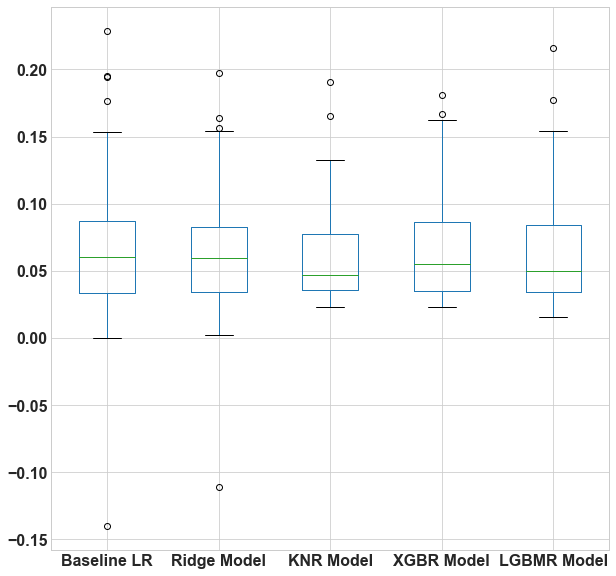

In [88]:
plt.rcParams.update({'font.size':16})
predictions_.boxplot()

<b> Statistical testing for model comparison </b> Models are run on the same dataset.
* <b> ANOVA Hypothesis Testing </b> (comparison between more than two groups)
  - H0: There is no difference in the mean predictions produced by the five different models above
  - H1: There is difference in the mean predictions produced by the five different models above
* <b> Pairwise t-test Hypothesis Testing </b> (comparison between two groups)
  - H0: There is no difference in the mean predictions produced by the two regression models XGB and LGB
  - H1: There is difference in the mean predictions produced by the two regression models XGB and LGB

In [89]:
pg.rm_anova(predictions_)

C:\Users\nhiii\anaconda3\lib\site-packages\pingouin\distribution.py:977: RuntimeWarning:

divide by zero encountered in double_scalars



,Source,ddof1,ddof2,F,p-unc,ng2,eps
0,Within,4,364,1.658464,0.159077,0.003492,0.567902


In [90]:
stats.ttest_rel(predictions_.iloc[:,-1], predictions_.iloc[:,-2])

Ttest_relResult(statistic=-0.6747563809635376, pvalue=0.5015412970002693)

# 4  Model explanation

In [91]:
BestModel = LGBMscores[LGBMscores.RMSE == LGBMscores['RMSE'].min()]
BestModel 

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
1,"{'max_depth': 150, 'min_child_weight': 1, 'learning_rate': 0.2411226576852262, 'n_estimators': 94, 'subsample': 0.4594239552749898, 'colsample_bytree': 0.781827115293081, 'reg_alpha': 0.06055142332023262, 'reg_lambda': 0.16104402760661984}",19.37611,0.038664,0.026307,0.813878


In [92]:
LGBMBest_estimators = BestModel.iloc[0,0]
LGBMBest_estimators

{'max_depth': 150,
 'min_child_weight': 1,
 'learning_rate': 0.2411226576852262,
 'n_estimators': 94,
 'subsample': 0.4594239552749898,
 'colsample_bytree': 0.781827115293081,
 'reg_alpha': 0.06055142332023262,
 'reg_lambda': 0.16104402760661984}

In [93]:
LGBMR = LGBMRegressor().set_params(**LGBMBest_estimators)
BestModel = LGBMR.fit(predictors_s1, target_s1)

In [94]:
# SHAPley values 

import shap

# Create a tree explainer
explainer = shap.TreeExplainer(BestModel, predictors_s1, feature_names=predictors_s1.columns.tolist())

# Shap values with tree explainer
shap_values = explainer.shap_values(predictors_s1, target_s1)

# Shap values with XGBoost core model
#booster = BestModel.get_booster()
#shap_values = booster.predict(xgb.DMatrix(predictors_s1, target_s1), pred_contribs=True)

shap_values.shape

(460, 116)

In [95]:
# SHAPley values 

import shap

# Create a tree explainer
explainer = shap.TreeExplainer(BestModel, predictors_s1, feature_names=predictors_s1.columns.tolist())

# Shap values with tree explainer
shap_values = explainer.shap_values(predictors_s1, target_s1)

# Shap values with XGBoost core model
#booster = BestModel.get_booster()
#shap_values = booster.predict(xgb.DMatrix(predictors_s1, target_s1), pred_contribs=True)

shap_values.shape

(460, 116)

In [96]:
col_names = list(x.columns)
feat_col_names = col_names[1:]

In [97]:
predictors_s1.columns = feat_col_names
shap_values = shap_values[:, :]
pd.DataFrame(shap_values, columns=predictors_s1.columns.tolist()).head()

,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days),Domestic,Eurobond,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,-0.003454,-0.004789,-0.012239,-0.009327,-0.000536,-0.001846,-0.011590,-0.008595,-0.005423,0.0,...,0.0,0.0,-0.001884,0.0,0.0,0.0,0.006539,0.0,0.0,0.0
1,-0.007824,-0.027474,-0.012123,0.003829,-0.005700,-0.038544,-0.036074,-0.004164,-0.002829,0.0,...,0.0,0.0,-0.002737,0.0,0.0,0.0,0.023655,0.0,0.0,0.0
2,0.000123,-0.008515,0.003871,-0.016614,-0.006231,0.009183,-0.024654,0.001483,-0.005343,0.0,...,0.0,0.0,0.012417,0.0,0.0,0.0,-0.001889,0.0,0.0,0.0
3,0.002400,0.008940,0.000965,-0.011107,0.007051,0.007218,0.067087,-0.002313,-0.004518,0.0,...,0.0,0.0,-0.003008,0.0,0.0,0.0,0.003825,0.0,0.0,0.0
4,-0.002607,-0.010734,-0.010884,-0.010419,0.015683,-0.016364,-0.017108,-0.004964,-0.003896,0.0,...,0.0,0.0,-0.001794,0.0,0.0,0.0,-0.002220,0.0,0.0,0.0


In [98]:
shap_sum = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame([predictors_s1.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['features', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

,features,shap_importance
90,Euro,0.02802
6,Coupon,0.018949
92,Japanese Yen,0.015544
5,Total Debt to Asset,0.015131
3,Governance Pillar Score,0.012234
...,...,...
44,Gas Utility,0.0
43,Food Processors,0.0
42,Financial,0.0
40,Conglomerate,0.0


<b> Feature importance </b>

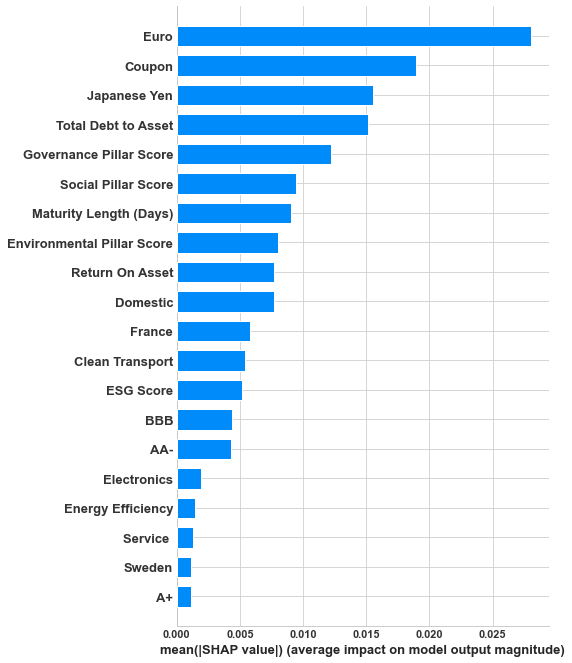

In [99]:
shap.summary_plot(shap_values, predictors_s1, plot_type="bar")

<b> Summary Plot </b>

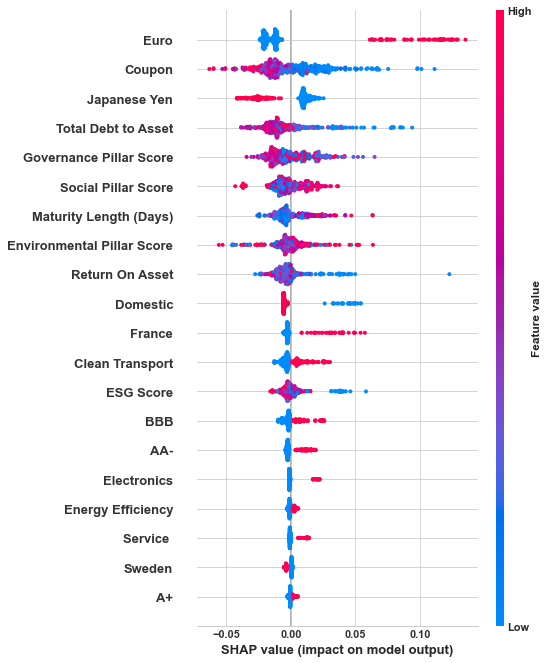

In [100]:
plt.figure(figsize=(25,40))
shap.summary_plot(shap_values, predictors_s1, feature_names=predictors_s1.columns)
plt.show()

<b> Dependence plot </b>

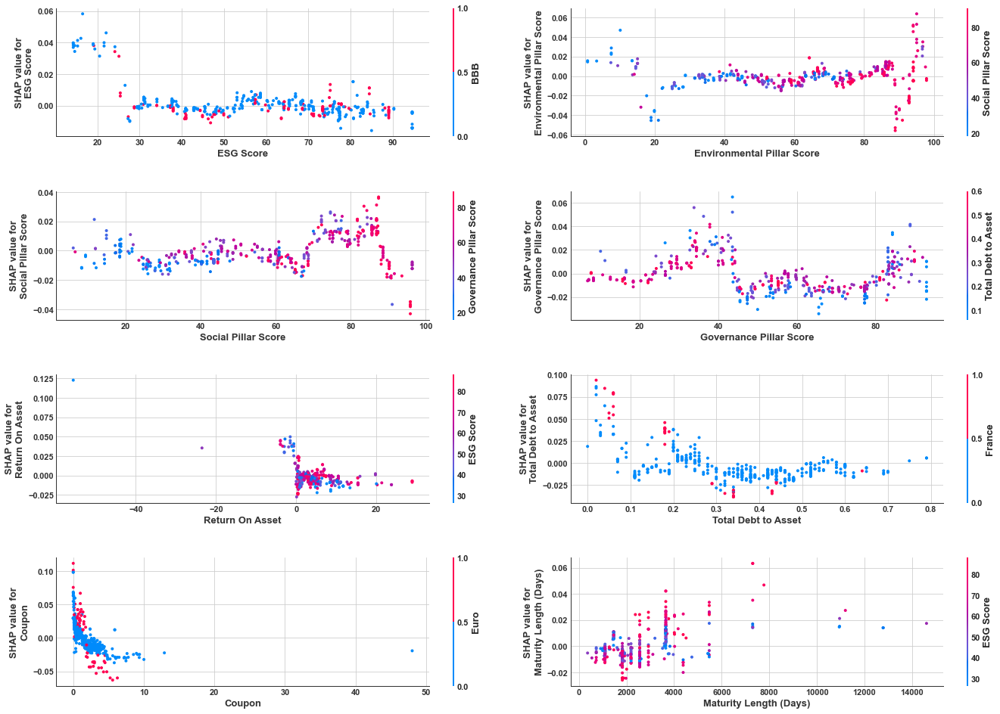

In [101]:
# adjust nrows, ncols to fit all your columns
plt.rcParams.update({'font.size': 36})
columns = predictors_s1.columns[:8]

# adjust nrows, ncols to fit all your columns
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 14))
axes = axes.ravel()

for i, col in enumerate(columns):
    shap.dependence_plot(col, shap_values, predictors_s1, ax=axes[i], show=False, interaction_index="auto")
    
plt.tight_layout()
plt.show()

<b> Decision plot </b>

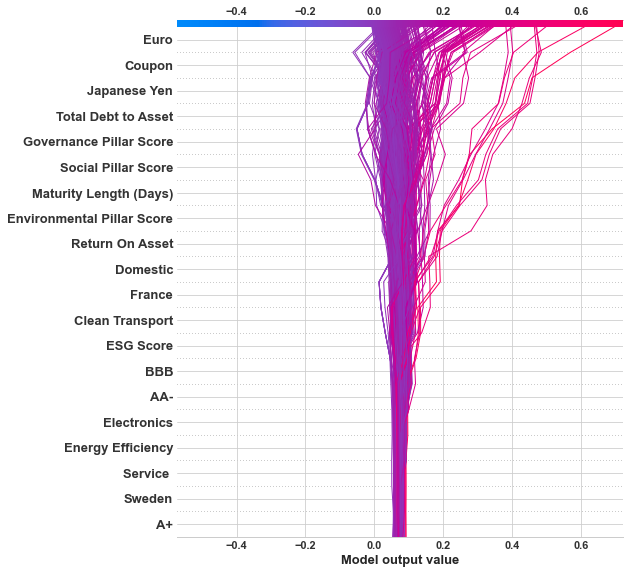

In [102]:
shap.decision_plot(explainer.expected_value, shap_values, predictors_s1.columns, highlight=0)